In [142]:
import pandas as pd 
import numpy as np 
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import mean_squared_error 
from scipy.stats import linregress 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline 
from scipy.spatial import distance 
from scipy.stats import nbinom
from sklearn.neighbors import KNeighborsRegressor 
import statsmodels.formula.api as smf 
import statsmodels.api as sm
import statsmodels.graphics as smg
import patsy
import math
from statsmodels.api import graphics
import seaborn as sns
sns.set(style='ticks', color_codes=True)
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from statsmodels.graphics.api import abline_plot
from scipy import stats
from statsmodels import graphics

#import os
#os.environ['PATH']

In [143]:
#BORIS
#predefined plotting functions
COLORS = np.array(['#E53935','#D81B60','#8E24AA','#5E35B1','#3949AB','#1E88E5','#039BE5','#00ACC1',
                       '#00897B','#43A047','#7CB342','#C0CA33','#FDD835','#FFB300','#FB8C00','#F4511E',
                       '#6D4C41','#757575','#546E7A'])
def plot_donut(df,col,
               title=None,
               COLORS=COLORS,
               color_idx=None,
               figsize=(25,15),
               textprops = {'fontsize':32,'color':'black','weight':'bold'},
               title_fontdict = {'fontsize':64,'weight':'bold'},
               pct_threshold=2,
               startangle=0,
               group_values_less_than=None,
               labels=None,
               save=False,
               sort_values=False,
               multilines_labels=False,
               rotatelabels=False,
               grouped=False):
    if title is None:
        title = col
    if color_idx is None:
        color_idx = slice(0,COLORS.size,1)
    if grouped:
        if sort_values:
            df.sort_index(inplace=True)
        else:
            df.sort_values(col,inplace=True,ascending=False)
        values = df[col].values
        internal_labels = df.index.values
    else:
        values = df[col].dropna().value_counts()
        if not group_values_less_than is None:
            series1 = df[col].copy()
            for value_idx in values[values<group_values_less_than].index:
                series1.loc[df[col]==value_idx] = 'Others'
            values = series1.dropna().value_counts()
        if sort_values:
            values.sort_values(inplace=True,ascending=False)
        else:
            values.sort_index(inplace=True)
        if not group_values_less_than is None:
            values = pd.concat((values.drop('Others'),values[['Others']]))
        internal_labels = values.index.values
    if not labels is None:
        internal_labels = labels
    if multilines_labels:
        internal_labels = [x.replace(' ','\n') for x in internal_labels]
        
    plt.figure(figsize=(25,15))
    ax = plt.pie(values,labels=internal_labels,colors=COLORS[color_idx],textprops=textprops,
            autopct=lambda p: '{:.1f}%'.format(p) if p>pct_threshold else '', pctdistance=0.8,
            startangle=startangle, rotatelabels=rotatelabels)
    centre_circle = plt.Circle((0,0),0.62,fc='white')
    if rotatelabels:
        angles = (np.cumsum(values.values) - values.values/2)/values.sum() * 360 + startangle
        angles = np.mod(angles,360)
        angles[np.logical_and(angles>90,angles<270)] -= 180
        #angles[values/values.sum()>0.1] -= 90
        for i, text in enumerate(ax[2]):
            text.set_rotation(angles[i])
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.text(0,0,title.upper(),fontsize=title_fontdict['fontsize'],fontweight=title_fontdict['weight'],
             horizontalalignment='center',verticalalignment='center')
    if save:
        plt.savefig('{}.png'.format(col.replace(' ','_').capitalize()),bbox_inches='tight')
    plt.show()
    
def plot_pie(df,col,
               title=None,
               COLORS=COLORS,
               color_idx=None,
               figsize=(25,15),
               textprops = {'fontsize':32,'color':'black','weight':'bold'},
               title_fontdict = {'fontsize':64,'weight':'bold'},
               pct_threshold=2,
               startangle=0,
               group_values_less_than=None,
               labels=None,
               save=False,
               sort_values=False,
               multilines_labels=False,
               rotatelabels=False,
               grouped=False):
    if title is None:
        title = col
    if color_idx is None:
        color_idx = slice(0,COLORS.size,1)
    if grouped:
        if sort_values:
            df.sort_index(inplace=True)
        else:
            df.sort_values(col,inplace=True,ascending=False)
        values = df[col].values
        internal_labels = df.index.values
    else:
        values = df[col].dropna().value_counts()
        if not group_values_less_than is None:
            series1 = df[col].copy()
            for value_idx in values[values<group_values_less_than].index:
                series1.loc[df[col]==value_idx] = 'Others'
            values = series1.dropna().value_counts()
        if sort_values:
            values.sort_values(inplace=True,ascending=False)
        else:
            values.sort_index(inplace=True)
        if not group_values_less_than is None:
            values = pd.concat((values.drop('Others'),values[['Others']]))
        internal_labels = values.index.values
    if not labels is None:
        internal_labels = labels
    if multilines_labels:
        internal_labels = [x.replace(' ','\n') for x in internal_labels]
        
    plt.figure(figsize=(25,15))
    ax = plt.pie(values,labels=internal_labels,colors=COLORS[color_idx],textprops=textprops,
            autopct=lambda p: '{:.1f}%'.format(p) if p>pct_threshold else '', pctdistance=0.6,
            startangle=startangle, rotatelabels=rotatelabels,labeldistance=None)
    plt.legend(prop=dict({'size':textprops['fontsize'],'weight':textprops['weight']}),
               loc='upper right',bbox_to_anchor=(1.38,0.9))
    plt.title(title.upper(),fontdict=title_fontdict,x=0.69,pad=-20)

    if save:
        plt.savefig('{}.png'.format(col.replace(' ','_').capitalize()),bbox_inches='tight')
    plt.show()    
    
def plot_multibar(df, cols, groupby=None, COLORS=COLORS,color_idx=None,title=None,save='False'):
    sns.set(style="whitegrid")
    if color_idx is None:
        color_idx = slice(0,COLORS.size,1)
    color_palette = sns.set_palette(COLORS[color_idx])
    plt.figure(figsize=(25,15))
    if groupby is None:
        values = df[cols].mean()
        sns.bar(values.index, values.values)
    else:
        hue_order = df[cols].mean().sort_values(ascending=False).index.values
        values = df[[groupby,cols[0]]]
        values['feature'] = cols[0]
        values.columns = [groupby, 'value', 'feature']
        for col in cols[1:]:
            sub_values = df[[groupby,col]]
            sub_values['feature'] = col
            sub_values.columns = [groupby, 'value', 'feature']
            values = pd.concat((values,sub_values))
        ax = sns.barplot(x=groupby,y='value',hue='feature',data=values,orient='v',errwidth=0,
                         palette=color_palette,order=np.sort(df[groupby].unique()),hue_order=hue_order)
        ax.set_ylabel('')
        if not title is None:
            ax.set_title(title.upper(),fontdict={'fontsize':64,'weight':'bold'},pad=25)
        ax.set_xlabel(ax.get_xlabel(),fontdict = {'fontsize': 36, 'fontweight': 'bold'})
        ax.set_xticklabels(ax.get_xticklabels(),fontdict = {'fontsize': 36, 'fontweight': 'bold'})
        y_labels = ['{:.0f}%'.format(x) for x in list(ax.get_yticks()*100)]
        ax.set_yticklabels(y_labels,fontdict = {'fontsize': 36, 'fontweight': 'bold'})
        hs, ls = ax.get_legend_handles_labels()
        new_ls = list()
        for l in ls:
            l = l.capitalize()
            new_l = ''
            while len(l) > 57:
                space_idx = l[:57].rindex(' ')
                new_l += l[:space_idx] + '\n'
                l = l[space_idx+1:]
            new_l += l
            new_ls.append(new_l)
        ax.legend(handles=hs, labels=new_ls, prop={'weight':'bold','size':36}, loc='upper left',
                  bbox_to_anchor=(0,-0.1))
    if save:
        plt.savefig('{}.png'.format(title.replace(' ','_').replace('\n','_').capitalize()),bbox_inches='tight')
    plt.show()

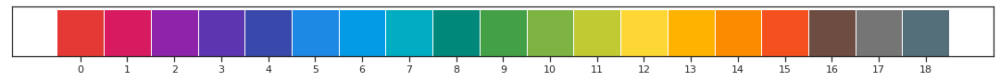

In [144]:
#BORIS
plt.figure(figsize=(19,1))
plt.bar(np.arange(COLORS.size),1,width=1,color=COLORS)
plt.xticks(np.arange(COLORS.size))
plt.yticks([])
plt.show()

# Introduction to Data

In [145]:
# read the files

In [146]:
test1 = pd.read_csv('Test 1.csv', encoding='utf-8')
test2_Europe = pd.read_csv('Test 2 Europe.csv', encoding='utf-8')
test2_USA = pd.read_csv('Test 2 USA.csv', encoding='utf-8')
test_USA_why = pd.read_csv('USA with Why.csv', encoding='utf-8')
exchanges = pd.read_csv('exchanges.csv', encoding='latin-1', engine='python')
print (len(test1), len(test2_Europe), len(test2_USA), len(test_USA_why), len(exchanges))

51 50 53 50 132


In [147]:
# check if the number of columns and the columns names are the same for all dataframes

In [148]:
exchanges.head()

,Unnamed: 0,Submission Date,Age,Gender,Where are you from?,My position is,My working sector is,My working industry is,What are your net earnings per year?,What do you think the definition of âpersonalizationâ is?,...,How do you value the following information >> Medical bills,How do you value the following information >> Apartment bills,"How do you value the following information >> Information about being married, or engaged to",How do you value the following information >> Having children,How do you value the following information >> Openness for new relationships,How do you value the following information >> Religion,How do you value the following information >> Sexual orientation,How do you value the following information >> Research for a new job,Where did you get the survey,"Please, provide us a feedback about the survey"
0,0,NaN,26,Female,UK,Student,Marketing,Tourism,$40000 - $70000,receiving recommendations based on my usage history (past history),...,Not shareable,Not shareable,Expensive,Expensive,Not shareable,Not shareable,Not shareable,Expensive,Survey Swap,no feedback
1,1,NaN,26,Male,Germany,Student,Public Relations/Communications,Non-profit,No income,receiving recommendations based on my usage history (past history); customizing user interface or service workflow taking into account my preferences,...,Not shareable,Not shareable,Not shareable,Not shareable,Not shareable,Not shareable,Not shareable,Not shareable,Survey Swap,Interesting Topic; Nice layout; Too many answer options for each question!;
2,2,NaN,21,Male,netherlands,Student,Legal/Compliance,Professional Services,< $40000,receiving recommendations based on my usage history (past history); receiving recommendations based on my intention to buy something (future impact); customizing user interface or service workflow taking into account my preferences,...,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Survey Swap,-
3,3,NaN,23,Female,The Netherlands,Student,Not applicable,Consumer,< $40000,customizing user interface or service workflow taking into account my preferences,...,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Survey Swap,The survey was too long.
4,4,NaN,21,Female,UK,Student,Customer Service,Consumer,< $40000,receiving recommendations based on my intention to buy something (future impact),...,Not shareable,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Expensive,Survey Swap,interesting


In [149]:
print('test 1 shape =')
print(test1.shape)

print('test2_Europe shape =')
print(test2_Europe.shape)

print('test2_USA shape =')
print(test2_USA.shape)

print('test_USA_why shape =')
print(test_USA_why.shape)

print('exchanges shape =')
print(exchanges.shape)

test 1 shape =
(51, 179)
test2_Europe shape =
(50, 179)
test2_USA shape =
(53, 179)
test_USA_why shape =
(50, 179)
exchanges shape =
(132, 170)


In [150]:
#BORIS
sources = exchanges['Where did you get the survey'].value_counts()
sources['Zoho'] = test1.shape[0] + test2_Europe.shape[0] + test2_USA.shape[0] + test_USA_why.shape[0]
sources = sources.to_frame()
sources

,Where did you get the survey
Survey Swap,73
Survey Tandem,53
Survey Circle,4
Facebook,2
Zoho,204


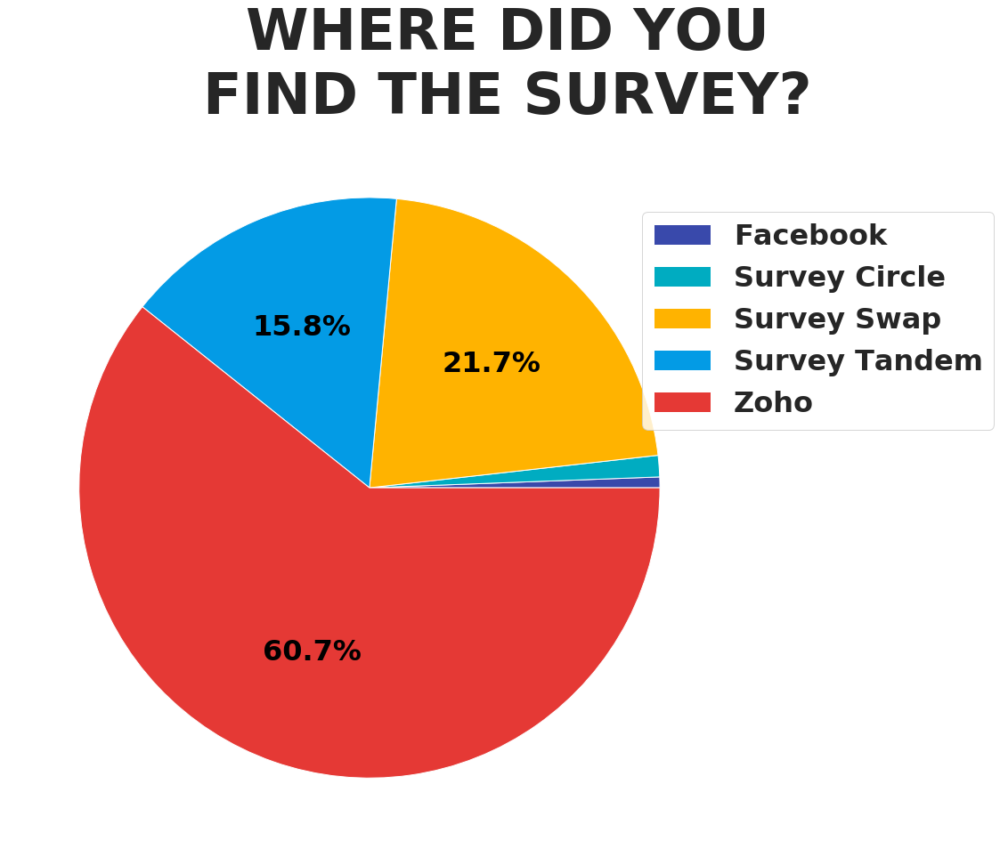

In [151]:
#BORIS
plot_pie(sources,'Where did you get the survey',title='Where did you\nfind the survey?',
         color_idx=[4,7,13,6,0],grouped=True,sort_values=True,startangle=0,save=True)

In [152]:
test1_col = test1.columns
test2_Europe_col = test2_Europe.columns

test2_USA_col = test2_USA.columns
test_USA_why_col = test_USA_why.columns
exchanges_col = exchanges.columns

In [153]:
print(test1_col.difference(test2_Europe_col))
print(test1_col.difference(test2_USA_col))
print(test1_col.difference(test_USA_why_col))
print(test1_col.difference(exchanges_col))

Index([], dtype='object')
Index([], dtype='object')
Index([], dtype='object')
Index(['Age range', 'Country', 'Email Address',
       'How do you feel about ...?[donating your information for scientific researches]',
       'How do you feel about ...?[getting personalized offers from companies, which you have sold your information?]',
       'How do you feel about ...?[getting personalized offers from companies, which you haven't provided your information?]',
       'How do you feel about ...?[selling your personal data to companies, which  you choose]',
       'How do you feel about ...?[sharing your personal data with companies, which share your data with third-parties (Often clause in terms of use)]',
       'How do you feel about sharing further information for personalized services[About your research to buy a car]',
       'How do you feel about sharing further information for personalized services[About your research to buy an apartment]',
       ...
       'How do you value the 

In [154]:
import re

exchanges_new = exchanges.copy()
repl = {'How do you feel about you are DONATING automatically the money to charities from selling y...' : 
       'How do you feel about you are DONATING automatically the money to charities from selling your information',
       '[sharing your personal data with companies, which share your data with third-parties (Often...]':
       '[sharing your personal data with companies, which share your data with third-parties (Often clause in terms of use)]',
        'How do you feel about you are SELLING automatically next information for personalized serv...':
        'How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself',
       #'about being':'on being',
        'Information about being':'Information on being',
        'Please, provide us a feedback about the survey':'Please, give us your feedback about this survey.'
        
       }

#add these to exchanges as None filled
missing_in_exchanges_col = [
    'How do you feel about you are DONATING automatically the money to charities from selling your information[Location history from your phone (GPS data)]',
    'How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[Location history from your phone (GPS data)]',
    'How do you value the following information[Location history from your phone (GPS data)]',
    'Age range', 'Country', 'Email Address', 'IP Address',
    'Please, explain why do you prefer to share the data instead of selling? (Or vice versa)',
    'Response Completed',
    'Response Started',
    'United Kingdom household income (yearly)',
    'United States household income (yearly)'
] 

for x in missing_in_exchanges_col:
    exchanges_new[x] = None

# drop these from exchanges
extra_in_exchanges_col = [
'Submission Date',    'Unnamed: 0',
    'Where did you get the survey'
]
for x in extra_in_exchanges_col:
    exchanges_new.drop(x, inplace=True, axis=1)

def remap(col):
    col = re.sub(r'(.*) >> (.*)', r'\1[\2]', col)
    col = re.sub(r'Information about being.*?,',r'Information on being married,', col)
    col = re.sub(r'What do you think.*',r'What do you think the definition of “personalization” is?', col)
    for k, v in repl.items():
        col = col.replace(k, v)
    return col

# use 'renames' to rename columns in exchanges
renames =  { x:remap(x) for x in exchanges_col}
exchanges_new.rename(renames, axis=1, inplace=True)

xcol = renames.values()
xcol = list(set(xcol) - set(extra_in_exchanges_col)) + missing_in_exchanges_col

print(len(test1_col))
print(len(xcol))

print(len(set(xcol) & set(test1_col)))
pd.options.display.max_rows = 200
pd.set_option('display.max_colwidth', 300)
max_len=max(len(xcol), len(test1_col))
p=pd.DataFrame({ 1: sorted(xcol)+[None]*(max_len-len(xcol)), 2: sorted(test1_col)+[None]*(max_len-len(test1_col))})
p['same'] = p[1] == p[2]
p[p['same'] != True]

179
179
179


,1,2,same


In [155]:
#BORIS
def get_country(answer):
    us_locations_list = ['Utah','United States of America', 'MD, USA', 'United States of America ',
                         'United States - east coast', 'USA', 'California, USA', 'America', 'US', 'Colorado',
                         'Florida - United States', 'United States', 'California', 'Philadelphia, PA, USA']
    uk_locations_list = ['UK', 'England', 'East Yorkshire, UK', 'London, UK', 'England ', 'United Kingdom',
                         'London uk', 'London', 'united kingdom', 'Wales', 'Newcastle', 'scotland',
                         'Birmingham (UK)']
    us_locations_list = [x.lower() for x in us_locations_list]
    uk_locations_list = [x.lower() for x in uk_locations_list]
    trans_dict = {'the netherlands': 'Netherlands',
                  'russia & german': 'Russia',
                  'istanbul': 'Turkey',
                  'amsterdam': 'Netherlands',
                  'holland':'Netherlands',
                  'viet nam': 'Vietnam',
                  'melbourne': 'Australia'}
    s1 = answer.lower()
    if s1 in us_locations_list:
        return 'United States'
    elif s1 in uk_locations_list:
        return 'United Kingdom'
    else:
        try:
            s1 = trans_dict[s1]
        except:
            pass
    return s1.capitalize()
    
exchanges_new['Country'] = exchanges['Where are you from?'].apply(get_country)

In [156]:
#BORIS
def get_age_range(age):
    range_dict = {0: '18 - 29',
                  1: '30 - 44',
                  2: '45 - 59',
                  3: '60 - 75'}
    if age >= 18:
        try:
             res = range_dict[(age * 0.999 + 0.07) // 15 - 1]
        except:
            res = None
    else:
        return None
    return res

exchanges_new['Age range'] = exchanges_new['Age'].apply(get_age_range)

In [157]:
# append dataframes

In [158]:
df = pd.DataFrame()
df = df.append(test1)
df = df.append(test2_Europe)
df = df.append(test2_USA)
df = df.append(test_USA_why)
df = df.append(exchanges_new, sort=True)

print(len(df.columns))
print(df.shape)

179
(336, 179)


In [159]:
# null values
df.isnull().sum().sort_values()

Age                                                                                                                                                                                                   0
How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[Having children]                                             0
How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[Information about your daily mood]                           0
How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[Information on being married, or engaged to]                 0
How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[Job/career information]                                      0


# Descriptions of Variables of Population

CATEGORICAL VARIABLES

1.1) United Kingdom household income (yearly)

In [160]:
df['uk_income_£'] = df['United Kingdom household income (yearly)'].copy()
df['uk_income_£'] = df['uk_income_£'].str.replace('£','')

In [161]:
df['uk_income_£'].sort_values().value_counts()

75,000 - 99,999    5
10,000 - 14,999    4
22,500 - 24,999    4
20,000 - 22,499    4
32,500 - 34,999    4
35,000 - 37,499    3
37,500 - 39,999    3
5,000 - 9,999      3
17,500 - 19,999    3
27,500 - 29,999    3
47,500 - 49,999    2
15,000 - 17,499    2
25,000 - 27,499    2
30,000 - 32,499    2
70,000 - 74,999    1
40,000 - 42,499    1
50,000 - 54,999    1
65,000 - 69,999    1
55,000 - 59,999    1
42,500 - 44,999    1
Name: uk_income_£, dtype: int64

In [162]:
# convert pounds to dollars

df['uk_income_dollars'] = df['uk_income_£'].copy()

replace = {
    '5,000 - 9,999':'6,332 - 12,663',
    '10,000 - 14,999':'12,664 - 18,995',
    '15,000 - 17,499':'18,996 - 22,161',
    '17,500 - 19,999':'22,162 - 25,327',
    '20,000 - 22,499':'25,328 - 28,493',
    '22,500 - 24,999':'28,494 - 31,659',
    '25,000 - 27,499':'31,660 - 34,825',
    '27,500 - 29,999':'34,826 - 37991',
    '30,000 - 32,499':'37,992 - 41,157',
    '32,500 - 34,999':'41,158 - 44,323',
    '35,000 - 37,499':'44,324 - 47,489',
    '37,500 - 39,999':'47,490 - 50,655',
    '40,000 - 42,499':'50,656 - 53,821',
    '42,500 - 44,999':'53,822 - 56,987',
    '45,000 - 47,499':'56,988 - 60,153',
    '47,500 - 49,999':'60,154 - 63,319',
    '50,000 - 54,999':'63,320 - 69651',
    '55,000 - 59,999':'69,652 - 75,983',
    '60,000 - 64,999':'75,984 - 82,315',
    '65,000 - 69,999':'82,316 - 88,647',
    '70,000 - 74,999':'88,648 - 94,979',
    '75,000 - 99,999':'94,980 - 126,639',
    None: 'other'
}


df['uk_income_dollars'] = df['uk_income_£'].replace(replace)



 A good idea could be to group the incames in fewer groups as the majority of them has just a few counts.

In [163]:
# £5,000 - £29,999
df.loc[
    (df['uk_income_£'] == '5,000 - 9,999') | 
    (df['uk_income_£'] == '10,000 - 14,999') |
    (df['uk_income_£'] == '15,000 - 17,499') |
    (df['uk_income_£'] == '17,500 - 19,999')|
    (df['uk_income_£'] == '20,000 - 22,499') | 
    (df['uk_income_£'] == '22,500 - 24,999') |
    (df['uk_income_£'] == '25,000 - 27,499') |
    (df['uk_income_£'] == '27,500 - 29,999'),
    'uk_income_£'] = '5,000 - 29,999' 


# £30,000 - £59,999
df.loc[    
    (df['uk_income_£'] == '30,000 - 32,499') |
    (df['uk_income_£'] == '32,500 - 34,999') |
    (df['uk_income_£'] == '35,000 - 37,499') |
    (df['uk_income_£'] == '37,500 - 39,999') |
    (df['uk_income_£'] == '40,000 - 42,499') | 
    (df['uk_income_£'] == '42,500 - 44,999') |
    (df['uk_income_£'] == '45,000 - 47,499') |
    (df['uk_income_£'] == '47,500 - 49,999') | 
    (df['uk_income_£'] == '50,000 - 54,999') |
    (df['uk_income_£'] == '55,000 - 59,999'), 
    'uk_income_£'] = '30,000 - 59,999' 

# £60,000 - £99,999
df.loc[
    (df['uk_income_£'] == '60,000 - 64,999') | 
    (df['uk_income_£'] == '65,000 - 69,999') |
    (df['uk_income_£'] == '70,000 - 74,999') |
    (df['uk_income_£'] == '75,000 - 99,999'), 
    'uk_income_£'] = '60,000 - 99,999'

# other
df.loc[
    (df['uk_income_£'].isnull()), 'uk_income_£'] = 'other'


In [164]:
df['uk_income_£'].sort_values().value_counts()

other              286
5,000 - 29,999      25
30,000 - 59,999     18
60,000 - 99,999      7
Name: uk_income_£, dtype: int64

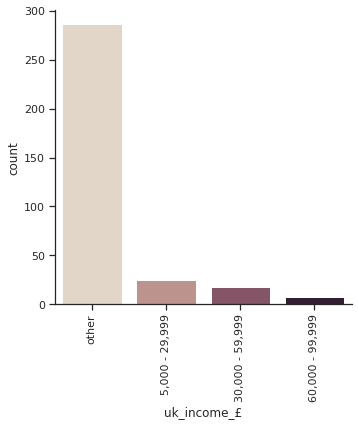

In [165]:
a = sns.catplot(x="uk_income_£", kind="count", palette="ch:.25", data=df)
a.set_xticklabels(rotation=90)

1.2) United States household income (yearly)

In [166]:
df['usa_income_$'] = df['United States household income (yearly)'].copy()
df['usa_income_$'] = df['usa_income_$'].str.replace('$','')

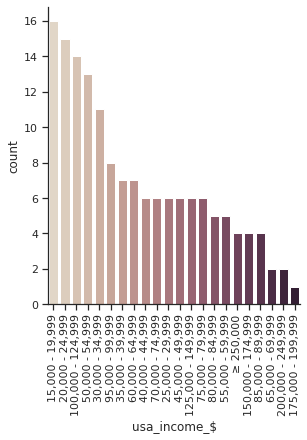

In [167]:
a = sns.catplot(x="usa_income_$", kind="count", palette="ch:.25", data=df, order = df['usa_income_$'].value_counts().index)
a.set_xticklabels(rotation=90)

In [168]:
df['usa_income_$'].sort_values().value_counts()

15,000 - 19,999      16
20,000 - 24,999      15
100,000 - 124,999    14
50,000 - 54,999      13
30,000 - 34,999      11
95,000 - 99,999       8
35,000 - 39,999       7
60,000 - 64,999       7
40,000 - 44,999       6
70,000 - 74,999       6
25,000 - 29,999       6
45,000 - 49,999       6
125,000 - 149,999     6
75,000 - 79,999       6
80,000 - 84,999       5
55,000 - 59,999       5
≥ 250,000             4
150,000 - 174,999     4
85,000 - 89,999       4
65,000 - 69,999       2
200,000 - 249,999     2
175,000 - 199,999     1
Name: usa_income_$, dtype: int64

A good idea could be to group the incames in fewer groups as the majority of them has just a few counts.

In [169]:
# $15,000 - $49,999
df.loc[
    (df['usa_income_$'] == '$15,000 - $19,999') | 
    (df['usa_income_$'] == '$20,000 - $24,999') |
    (df['usa_income_$'] == '$25,000 - $29,999') |
    (df['usa_income_$'] == '$30,000 - $34,999')|
    (df['usa_income_$'] == '$35,000 - $39,999') | 
    (df['usa_income_$'] == '$40,000 - $44,999') |
    (df['usa_income_$'] == '$45,000 - $49,999'),
    'usa_income_$'] = '$15,000 - $49,999' 

# $50,000 - $99,999
df.loc[
    (df['usa_income_$'] == '50,000 - 54,999') |
    (df['usa_income_$'] == '55,000 - 59,999') | 
    (df['usa_income_$'] == '60,000 - 64,999') |
    (df['usa_income_$'] == '65,000 - 69,999') |
    (df['usa_income_$'] == '70,000 - 74,999')|
    (df['usa_income_$'] == '75,000 - 79,999') | 
    (df['usa_income_$'] == '80,000 - 84,999') |
    (df['usa_income_$'] == '85,000 - 89,999') | 
    (df['usa_income_$'] == '90,000 - 94,999') |
    (df['usa_income_$'] == '95,000 - 99,999'),
    'usa_income_$'] = '50,000 - 99,999' 

# $100,000 - $199,999
df.loc[
    (df['usa_income_$'] == '100,000 - 124,999') |
    (df['usa_income_$'] == '125,000 - 149,999') | 
    (df['usa_income_$'] == '150,000 - 174,999') |
    (df['usa_income_$'] == '175,000 - 199,999'),
    'usa_income_$'] = '100,000 - 199,999'

# >= $200,000
df.loc[
    (df['usa_income_$'] == '200,000 - 249,999') |
    (df['usa_income_$'] == '≥ 250,000'),
    'usa_income_$'] = '≥ 200,000'

# other
df.loc[
    (df['usa_income_$'].isnull()), 'usa_income_$'] = 'other'

In [170]:
df['usa_income_$'].sort_values().value_counts()

other                182
50,000 - 99,999       56
100,000 - 199,999     25
15,000 - 19,999       16
20,000 - 24,999       15
30,000 - 34,999       11
35,000 - 39,999        7
≥ 200,000              6
40,000 - 44,999        6
25,000 - 29,999        6
45,000 - 49,999        6
Name: usa_income_$, dtype: int64

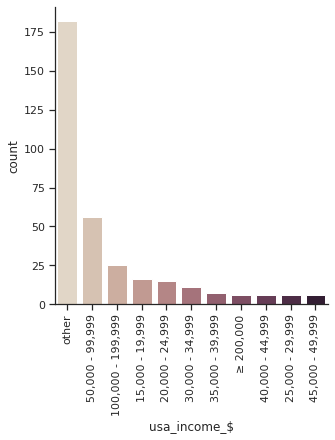

In [171]:
a = sns.catplot(x="usa_income_$", kind="count", palette="ch:.25", data=df, order = df['usa_income_$'].value_counts().index)
a.set_xticklabels(rotation=90)

In [172]:
# Conversion UK pounds to USA dollars
def uk2us(p):
    if p is None:
        return None
    a,b = p
    r = 0.689 #PPP UK to USA
    return int(a/r), int(b/r)
    
def str2tup(s):
    if s is None or s in ['other','prefer not to say']:
        return None
    if type(s) is float: # nan
        return None
    s=s.replace('$','').replace('£','').replace(',','')
    if s == 'No income':
        return (0,0)
    elif s == 'other':
        return  None
    elif '≥' in s:
        return (int(s.replace('≥', '')), 999999999)
    elif '>' in s:
        return (int(s.replace('>', '')), 999999999)    
    elif '<' in s:
        return (0, int(s.replace('<', '')))
    elif '-' in s:
        l, r = s.split('-')
        return int(l), int(r)
    print (s)
    return None
df['uki'] = df['United Kingdom household income (yearly)'].apply(str2tup).apply(uk2us)
df['usi'] = df['United States household income (yearly)'].apply(str2tup)
df['net_earnings'] = df['What are your net earnings per year?'].apply(str2tup)
df['household_income'] = None
df.loc[df['uki'].notnull(), 'household_income'] = df.loc[df['uki'].notnull(), 'uki']
df.loc[df['usi'].notnull(), 'household_income'] = df.loc[df['usi'].notnull(), 'usi']
df.drop('uki', inplace=True, axis=1)
df.drop('usi', inplace=True, axis=1)
#df[['uki','usi','net_earnings', 'household_income']]

# null value net_earnings
df.loc[
    (df['household_income'].isnull()), 'household_income'] = df.loc[
    (df['household_income'].isnull()), 'net_earnings'] 

13 000


1.3) Age range

In [173]:
df['age_range'] = df['Age range'].copy()

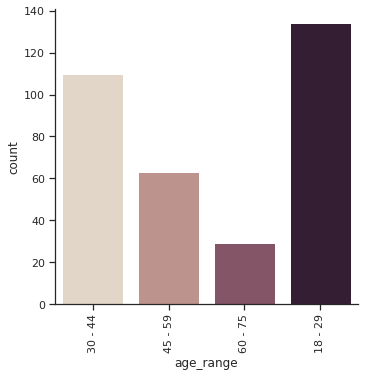

In [174]:
a = sns.catplot(x="age_range", kind="count", palette="ch:.25", data=df)
a.set_xticklabels(rotation=90)

In [175]:
df[['Age','age_range']]

,Age,age_range
0,43,30 - 44
1,33,30 - 44
2,54,45 - 59
3,65,60 - 75
4,35,30 - 44
...,...,...
127,46,45 - 59
128,23,18 - 29
129,44,30 - 44
130,28,18 - 29


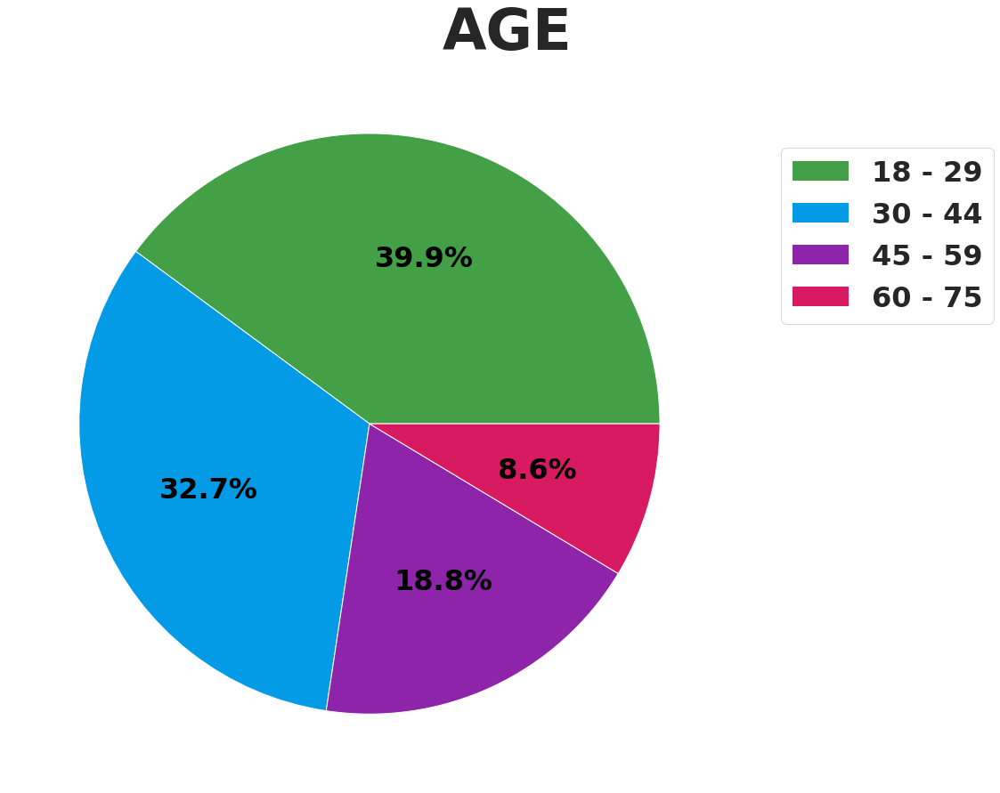

In [176]:
#BORIS
#plot_donut(df,'age_range',title='age',color_idx = [9,11,14,0],save=True)
plot_pie(df,'age_range',title='Age',color_idx = [9,6,2,1],save=True)

In [177]:
df['age_range'].sort_values().value_counts(dropna=False)

18 - 29    134
30 - 44    110
45 - 59     63
60 - 75     29
Name: age_range, dtype: int64

1.4) Gender

In [178]:
df['gender'] = df['Gender'].copy()

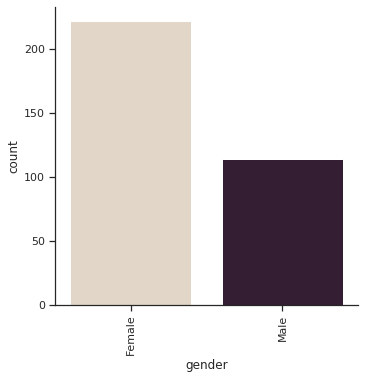

In [179]:
a = sns.catplot(x="gender", kind="count", palette="ch:.25", data=df)
a.set_xticklabels(rotation=90)

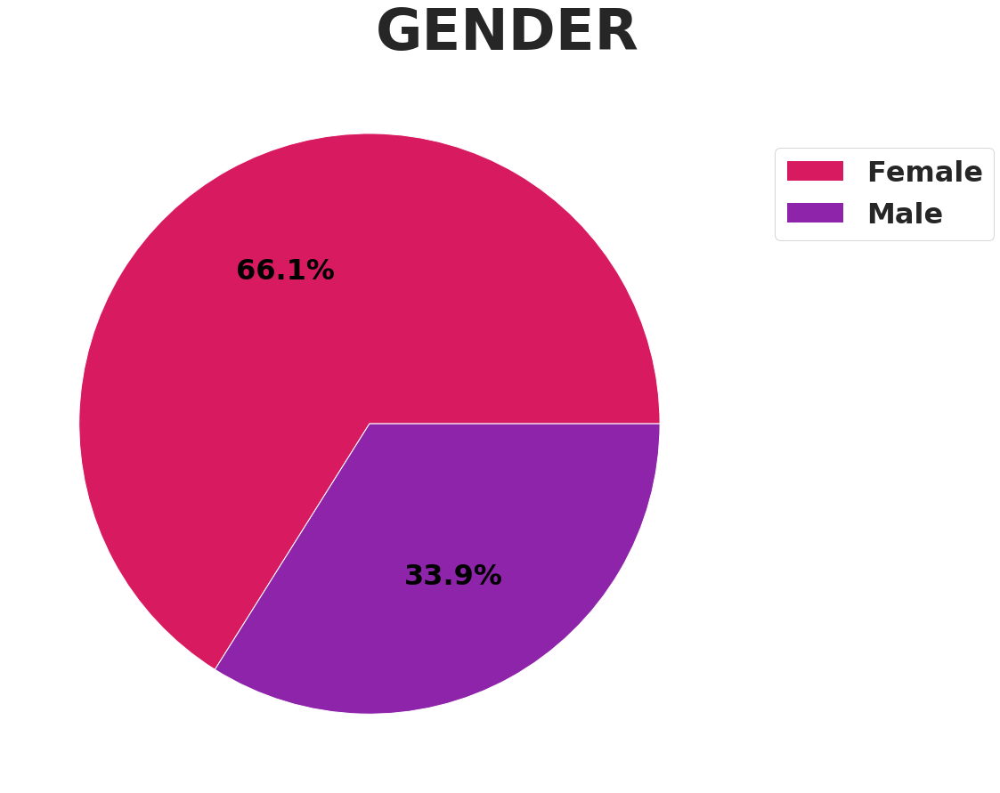

In [180]:
#BORIS
plot_pie(df,'gender',title='Gender',color_idx = [1,2],save=True)

In [181]:
df['gender'].sort_values().value_counts(dropna=False)

Female    222
Male      114
Name: gender, dtype: int64

1.5) Country

In [182]:
df['country'] = df['Country'].copy()

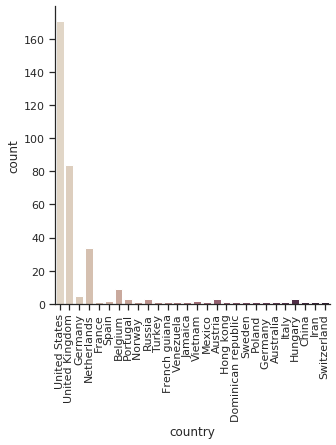

In [183]:
a = sns.catplot(x="country", kind="count", palette="ch:.25", data=df)
a.set_xticklabels(rotation=90)

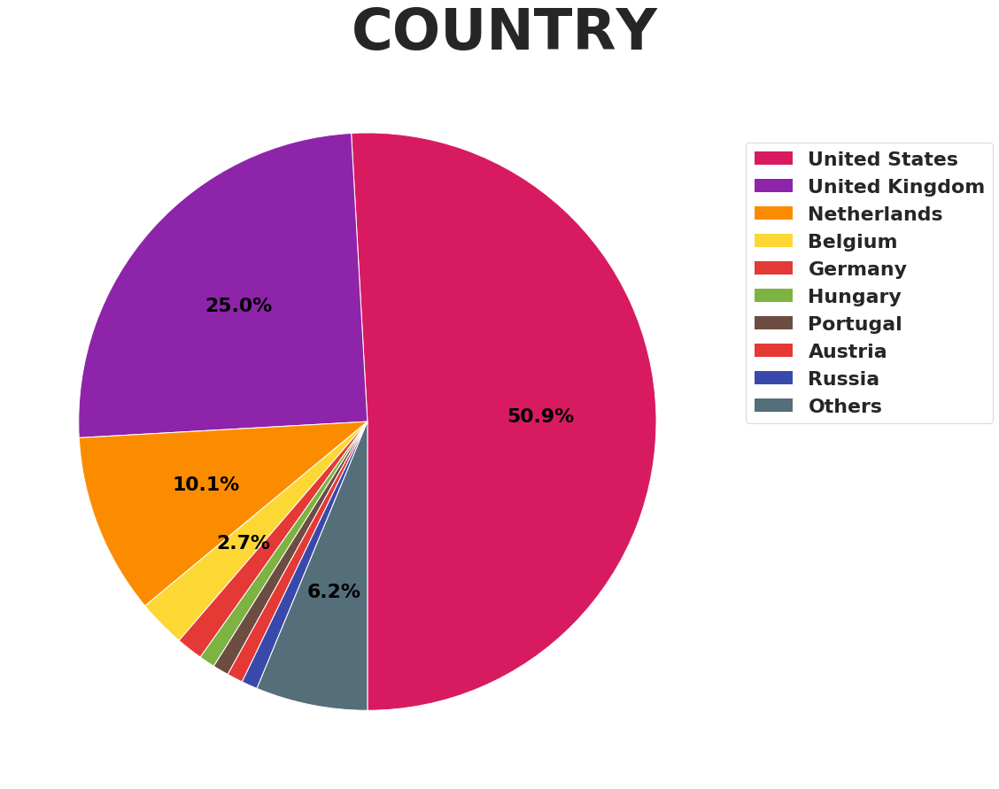

In [184]:
#BORIS
plot_pie(df,'country',title='Country',color_idx=[1,2,14,12,0,10,16,0,4,18],sort_values=True,multilines_labels=False,
         save=True,rotatelabels=True,
           group_values_less_than=3,startangle=270, textprops={'fontsize':22,'color':'black','weight':'bold'},
           pct_threshold=2)

In [185]:
df['country'].sort_values().value_counts(dropna=False)

United States         171
United Kingdom         84
Netherlands            34
Belgium                 9
Germany                 5
Austria                 3
Portugal                3
Hungary                 3
Russia                  3
Vietnam                 2
Spain                   2
Dominican republic      1
China                   1
Turkey                  1
Jamaica                 1
Poland                  1
Switzerland             1
French guiana           1
Sweden                  1
Norway                  1
Italy                   1
France                  1
Germany                 1
Iran                    1
Mexico                  1
Hong kong               1
Australia               1
Venezuela               1
Name: country, dtype: int64

In [186]:
# other
df.loc[
    (df['country'].isnull()), 'country'] = 'other'

1.7) My position is

In [187]:
df['position'] = df['My position is'].str.lower()

In [188]:
df.loc[
(df['position'] == 'on disability'),
'position'] = 'disabled'

# individuals
df.loc[
(df['position'] == 'senior claims technician') |
(df['position'] == 'physical therapist') |
(df['position'] == 'staff') |
(df['position'] == 'cleaner')|
(df['position'] == 'nursery nurse') |
(df['position'] == 'supervisor') |
(df['position'] == 'accounting analyst') |
(df['position'] == 'loan assistant') |
(df['position'] == 'consultant') |
(df['position'] == 'teacher') |
(df['position'] == 'social worker') |
(df['position'] == 'driver') |
(df['position'] == 'plumber') |
(df['position'] == 'secretary') |
(df['position'] == 'pee-on'),
'position'] = 'individual contributor'

# homemaker
df.loc[
    (df['position'] == 'homemaker') | 
    (df['position'] == 'stay at home parent') |
    (df['position'] == 'housewife') |
    (df['position'] == 'mom')|
    (df['position'] == 'wife & mothet') | 
    (df['position'] == 'house wife'),
    'position'] = 'homemaker' 

# unemployed
df.loc[
    (df['position'] == 'unemployed') | 
    (df['position'] == 'unemployed at the moment'),
    'position'] = 'unemployed' 


In [189]:
# other
x= df['position'].value_counts( )
others =list(x[x < 5].keys())
df.loc[df['position'].apply(lambda x:x in others), 'position'] = 'other'

In [190]:
df['position'].value_counts()

student                   117
individual contributor     56
manager                    43
retiree                    25
owner                      25
director                   14
homemaker                  14
unemployed                 10
c-level                     9
other                       8
disabled                    6
intern                      6
Name: position, dtype: int64

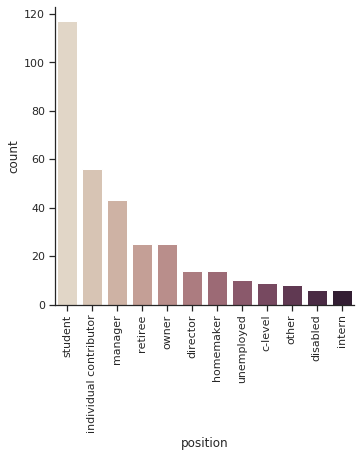

In [191]:
a = sns.catplot(x="position", kind="count", palette="ch:.25", data=df, order = df['position'].value_counts().index)
a.set_xticklabels(rotation=90)

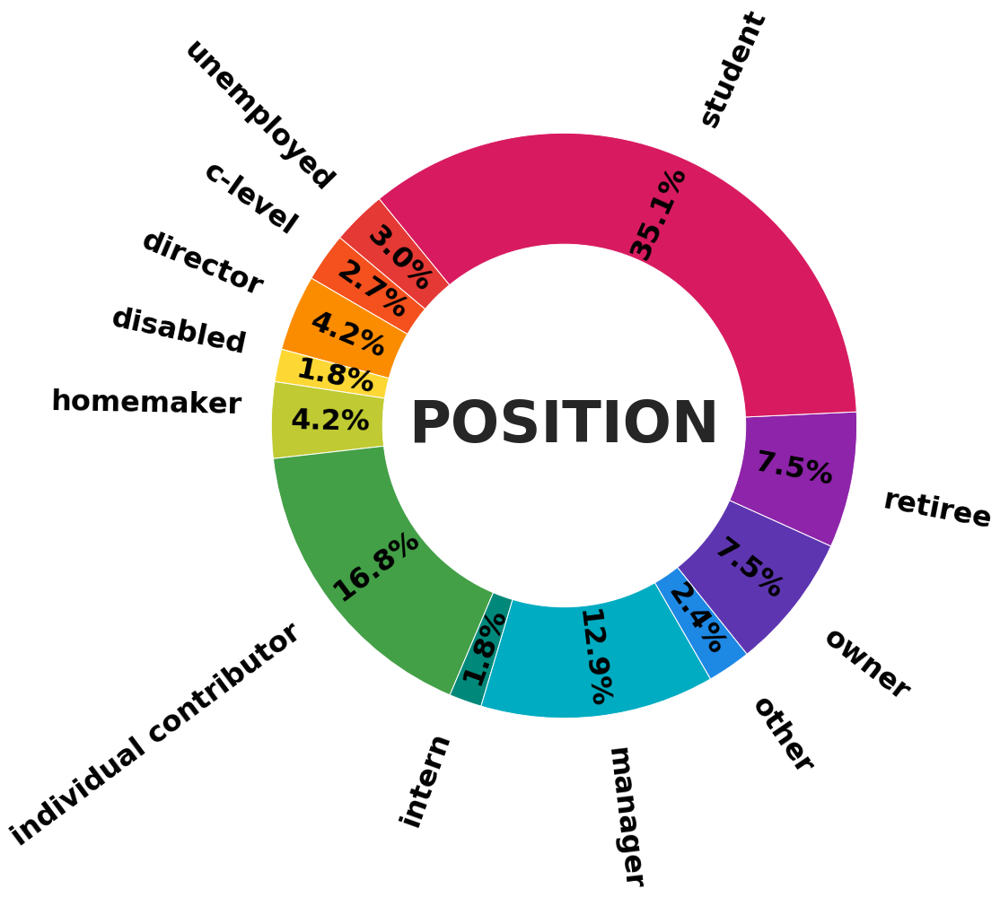

In [192]:
#BORIS
plot_donut(df,'position',color_idx = [15,14,12,11,9,8,7,5,3,2,1,0],pct_threshold=1.5,rotatelabels=True,startangle=140)

In [193]:
# other
df.loc[
    (df['position'].isnull()), 'position'] = 'other'

1.8) My working sector is

In [194]:
df['sector'] = df['My working sector is'].str.lower()

In [195]:
#df['sector'].value_counts()

In [196]:
# none
df.loc[
    (df['sector'] == 'not applicable') |
    (df['sector'] == 'none'),
    'sector'] = 'none'

# child_care
df.loc[
    (df['sector'] == 'childcare') |
    (df['sector'] == 'babysitter') |
    (df['sector'] == 'child cate6') |
    (df['sector'] == 'child care'),
    'sector'] = 'childcare'
    
# homemaker
df.loc[
    (df['sector'] == 'homemaker') |
    (df['sector'] == 'stay at home parent'),
    'sector'] = 'homemaker'

# other
x= df['sector'].value_counts( )
others =list(x[x < 5].keys())
df.loc[df['sector'].apply(lambda x:x in others), 'sector'] = 'other'

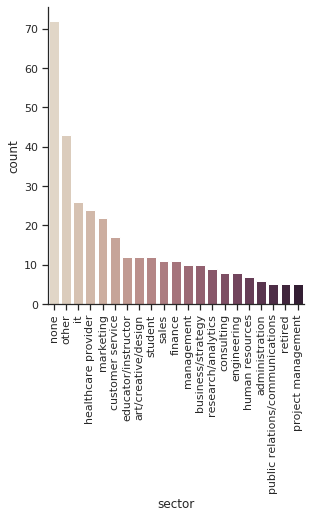

In [197]:
a = sns.catplot(x="sector", kind="count", palette="ch:.25", data=df, order = df['sector'].value_counts().index)
a.set_xticklabels(rotation=90)

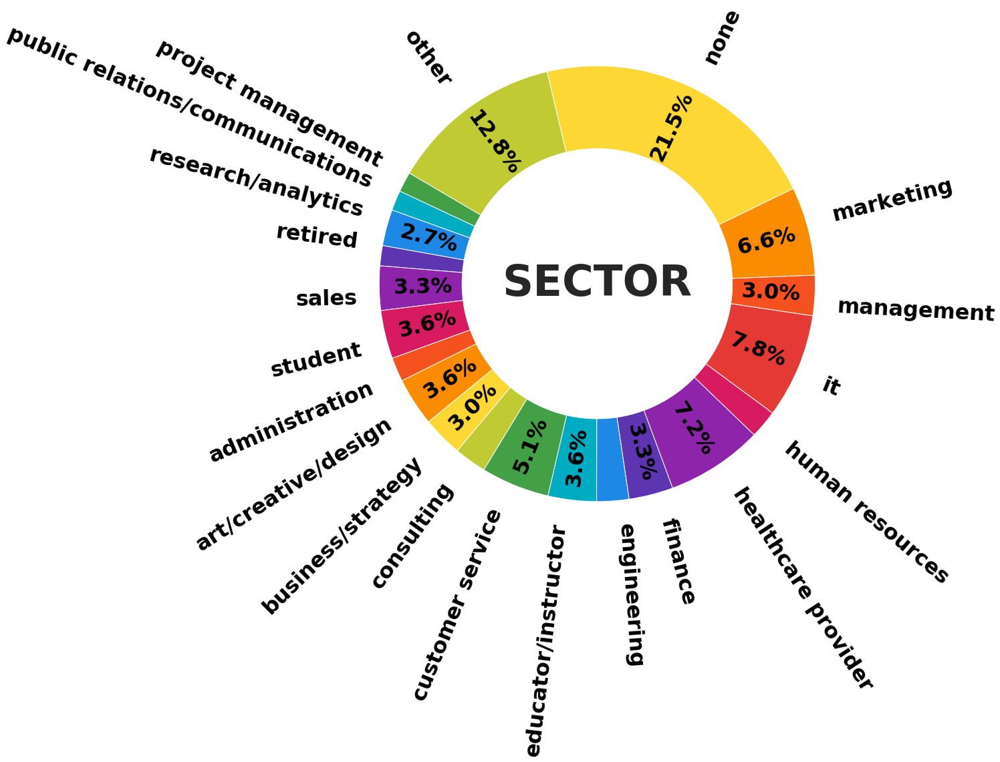

In [198]:
#BORIS
plot_donut(df,'sector',color_idx=[15,14,12,11,9,7,5,3,2,1,0],pct_threshold=2.5,startangle=200,rotatelabels=True)

1.9) My working industry is

In [199]:
df['industry'] = df['My working industry is'].str.lower()

In [200]:
#df['industry'].value_counts()

In [201]:
# education
df.loc[
    (df['industry'] == 'student') |
    (df['industry'] == 'psichology student') |
    (df['industry'] == "I'm still studying") |
    (df['industry'] == 'university'),
    'industry'] = 'education'

# unemployed
df.loc[
    (df['industry'] == 'unemployed') | 
    (df['industry'] == 'unemployed at the moment') |
    (df['industry'] == "i don't work") |
    (df['industry'] == "none") |
    (df['industry'] == "n a") |
    (df['industry'] == "not applicable") |
    (df['industry'] == "n?a") |
    (df['industry'] == "don't work")|
    (df['industry'] == 'no longer in work force'), 
    'industry'] = 'unemployed'

# retired
df.loc[
    (df['industry'] == "I'm retired"),
    'industry'] = 'retired'

# other
x= df['industry'].value_counts( )
others =list(x[x < 5].keys())
df.loc[df['industry'].apply(lambda x:x in others), 'industry'] = 'other'

In [202]:
df['industry'].value_counts()

other                    57
consumer                 46
education                44
healthcare               36
technology               31
unemployed               25
professional services    24
non-profit               17
manufacturing            15
finance                  14
retired                  10
transport                 8
retail                    6
Name: industry, dtype: int64

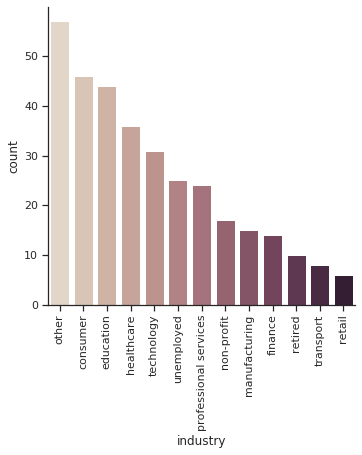

In [203]:
a = sns.catplot(x="industry", kind="count", palette="ch:.25", data=df, order = df['industry'].value_counts().index)
a.set_xticklabels(rotation=90)

1.10) What are your net earnings per year?

In [204]:
df['net_earnings_$'] = df['What are your net earnings per year?'].str.lower()
df['net_earnings_$'] = df['net_earnings_$'].str.replace('$','')

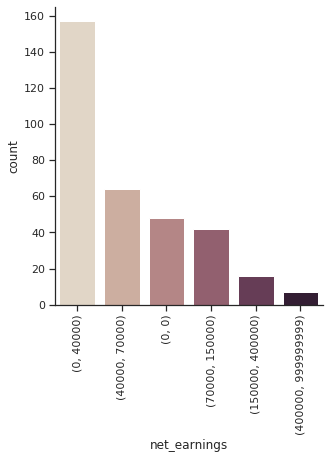

In [205]:
a = sns.catplot(x="net_earnings", kind="count", palette="ch:.25", data=df, order = df['net_earnings'].value_counts().index)
a.set_xticklabels(rotation=90)

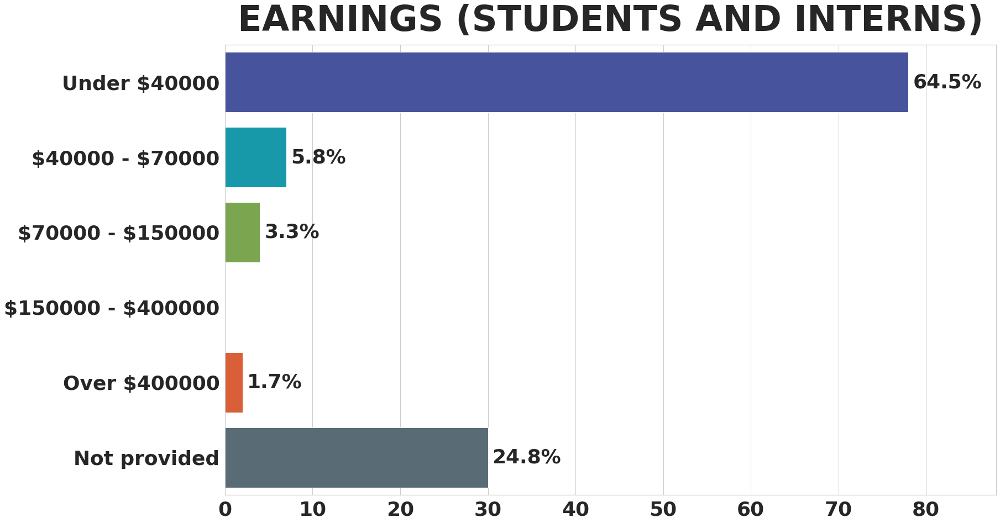

In [206]:
#BORIS
COLORS = np.array(['#E53935','#D81B60','#8E24AA','#5E35B1','#3949AB','#1E88E5','#039BE5','#00ACC1',
                   '#00897B','#43A047','#7CB342','#C0CA33','#FDD835','#FFB300','#FB8C00','#F4511E',
                   '#6D4C41','#757575','#546E7A'])
col = 'net_earnings'
title = 'earnings (students and interns)'
sns.set(style="whitegrid")
color_idx = [4,7,10,12,15,18]
COLORS_PALETTE = sns.set_palette(COLORS[color_idx])
values = df[col].value_counts()
values[:] = 0
sub_values = df.loc[df['position'].isin(['student','intern']),col].value_counts()
values[sub_values.index] = sub_values
values = pd.concat((values.drop((0,0)),values[[(0,0)]]))
labels = list()
for item in values.index.values:
    if item[0] == 0:
        if item[1] == 0:
            labels.append('Not provided')
        else:
            labels.append('Under ${}'.format(item[1]))
    elif item[1] >= 1000000:
        labels.append('Over ${}'.format(item[0]))
    else:
        labels.append('\${0} - \${1}'.format(item[0],item[1]))
plt.figure(figsize=(25,15))
ax = sns.barplot(values.values,labels,orient='h',palette=COLORS_PALETTE)
ax.set_title(title.upper(),fontdict={'fontsize':64,'weight':'bold'},pad=25)
ax.set_xticklabels(ax.get_xticks().astype(int),fontdict = {'fontsize': 36, 'fontweight': 'bold'})
ax.set_yticklabels(ax.get_yticklabels(),fontdict = {'fontsize': 36, 'fontweight': 'bold'})
ax.set_xlim((0,88))
total = values.sum()
for p in ax.patches:
    if p.get_width() == 0:
        percentage = ''
    else:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
    x = p.get_x() + p.get_width() + 0.5
    y = p.get_y() + p.get_height()/2
    ax.text(x,y,percentage,fontsize=36,fontweight='bold',verticalalignment='center', horizontalalignment='left')

plt.savefig('Earnings_(students_and_interns).png',bbox_inches='tight')

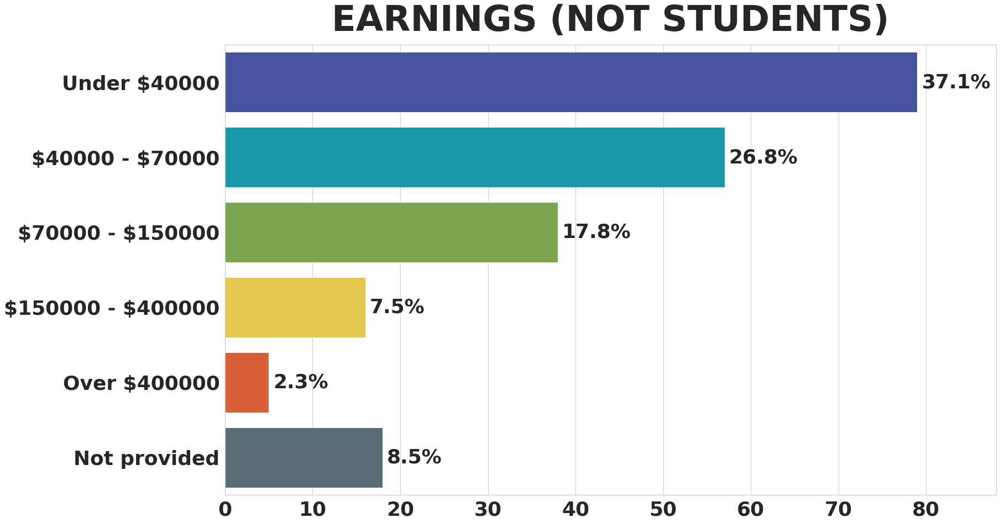

In [207]:
#BORIS
COLORS = np.array(['#E53935','#D81B60','#8E24AA','#5E35B1','#3949AB','#1E88E5','#039BE5','#00ACC1',
                   '#00897B','#43A047','#7CB342','#C0CA33','#FDD835','#FFB300','#FB8C00','#F4511E',
                   '#6D4C41','#757575','#546E7A'])
col = 'net_earnings'
title = 'earnings (not students)'
sns.set(style="whitegrid")
color_idx = [4,7,10,12,15,18]
COLORS_PALETTE = sns.set_palette(COLORS[color_idx])
values = df[col].value_counts()
values[:] = 0
sub_values = df.loc[np.logical_not(df['position'].isin(['student','intern'])),col].value_counts()
values[sub_values.index] = sub_values
values = pd.concat((values.drop((0,0)),values[[(0,0)]]))
labels = list()
for item in values.index.values:
    if item[0] == 0:
        if item[1] == 0:
            labels.append('Not provided')
        else:
            labels.append('Under ${}'.format(item[1]))
    elif item[1] >= 1000000:
        labels.append('Over ${}'.format(item[0]))
    else:
        labels.append('\${0} - \${1}'.format(item[0],item[1]))
plt.figure(figsize=(25,15))
ax = sns.barplot(values.values,labels,orient='h',palette=COLORS_PALETTE)
ax.set_title(title.upper(),fontdict={'fontsize':64,'weight':'bold'},pad=25)
ax.set_xticklabels(ax.get_xticks().astype(int),fontdict = {'fontsize': 36, 'fontweight': 'bold'})
ax.set_yticklabels(ax.get_yticklabels(),fontdict = {'fontsize': 36, 'fontweight': 'bold'})
ax.set_xlim((0,88))
total = values.sum()
for p in ax.patches:
    if p.get_width() == 0:
        percentage = ''
    else:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
    x = p.get_x() + p.get_width() + 0.5
    y = p.get_y() + p.get_height()/2
    ax.text(x,y,percentage,fontsize=36,fontweight='bold',verticalalignment='center', horizontalalignment='left')

plt.savefig('Earnings_(not_students).png',bbox_inches='tight')

In [208]:
clean=pd.DataFrame()

In [209]:
population_cols = ['Age', 'gender', 'country', 'position', 'sector', 'industry', 'net_earnings', 'household_income']
clean[population_cols] = df[population_cols].copy()

1.13)'How do you feel about ...?

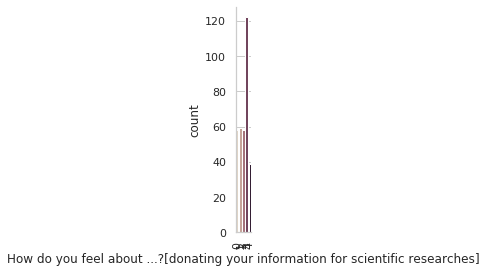

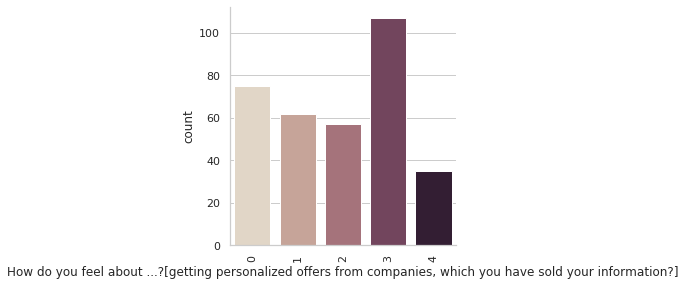

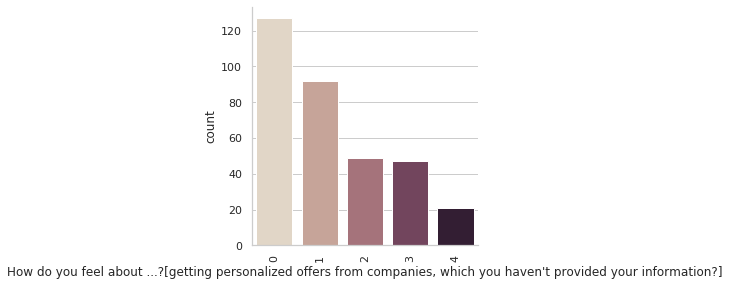

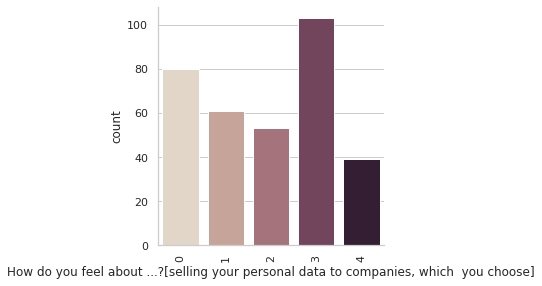

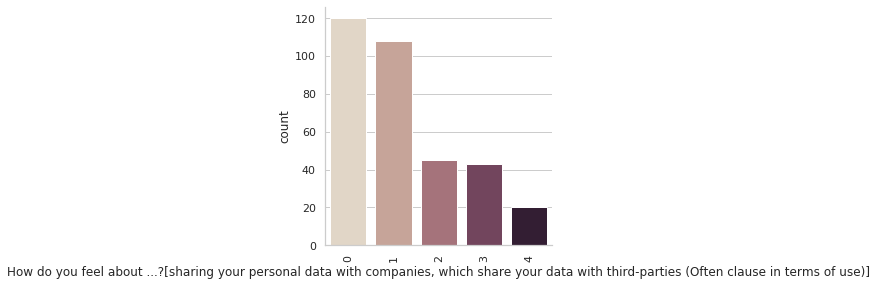

In [210]:
feel_about = [x for x in df.columns if x.startswith('How do you feel about ...?')]

for x in feel_about:
    
    clean[x] = df[x].copy()
    # Totally disagree
    clean.loc[
        (clean[x] == 'Totally disagree'), x] = int(0)

    # Disagree
    clean.loc[
        (clean[x] == 'Disagree'), x] = int(1)

    # Don't care and other
    clean.loc[
        (clean[x] == 'other') |
        (clean[x] == "Don't care") |
        (clean[x] == "Don\\'t care") |
        (clean[x].isnull()),
        x] = int(2)

    # Agree
    clean.loc[
        (clean[x] == 'Agree'), x] = int(3)

    # Absolutely agree
    clean.loc[
        (clean[x] == 'Absolutely agree'), x] = int(4)

    a = sns.catplot(x=x, kind="count", palette="ch:.25", data=clean, order = [0, 1, 2, 3, 4], height=4, aspect=1)
    a.set_xticklabels(rotation=90)

In [211]:
clean.head()

,Age,gender,country,position,sector,industry,net_earnings,household_income,How do you feel about ...?[donating your information for scientific researches],"How do you feel about ...?[getting personalized offers from companies, which you have sold your information?]","How do you feel about ...?[getting personalized offers from companies, which you haven't provided your information?]","How do you feel about ...?[selling your personal data to companies, which you choose]","How do you feel about ...?[sharing your personal data with companies, which share your data with third-parties (Often clause in terms of use)]"
0,43,Female,United States,homemaker,none,unemployed,"(40000, 70000)","(55000, 59999)",0,2,4,2,4
1,33,Female,United States,student,none,education,"(40000, 70000)","(50000, 54999)",2,2,2,2,1
2,54,Female,United States,retiree,other,non-profit,"(0, 40000)","(15000, 19999)",1,1,1,1,1
3,65,Male,United States,retiree,none,retired,"(0, 40000)","(20000, 24999)",1,1,1,1,1
4,35,Male,United States,manager,management,manufacturing,"(70000, 150000)","(20000, 24999)",3,3,3,3,3


1.14) How do you feel about sharing further information for personalized services[......]

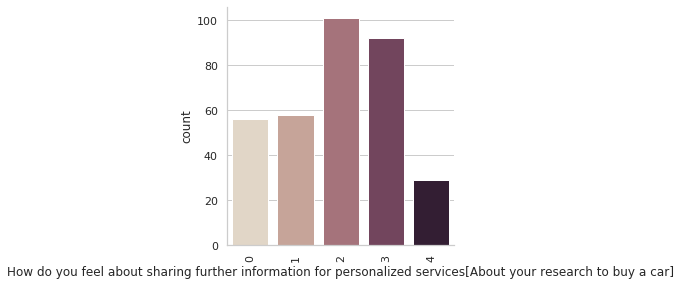

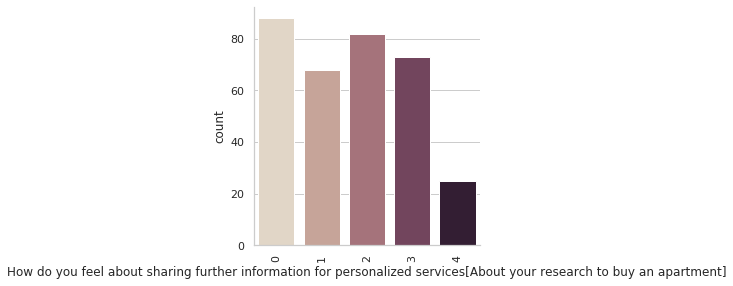

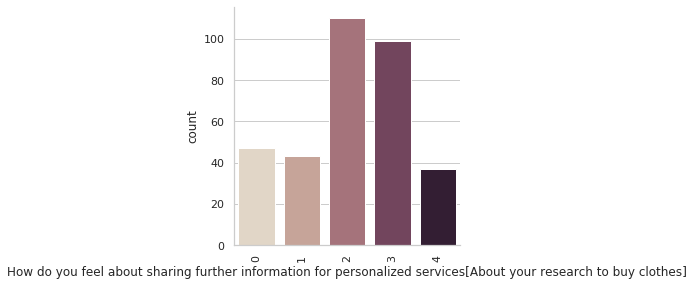

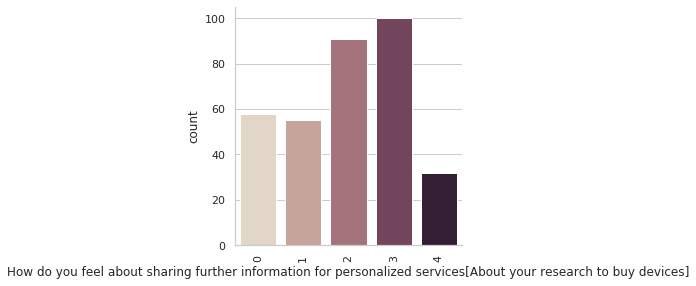

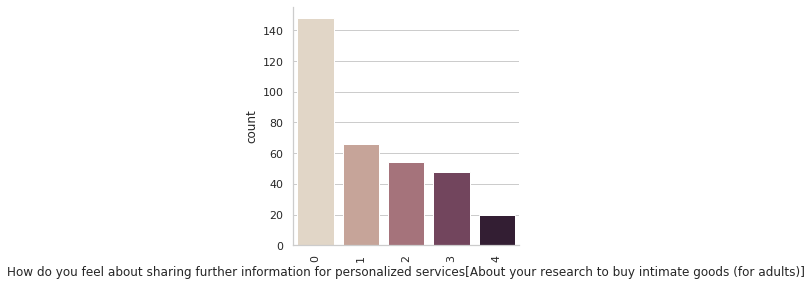

...

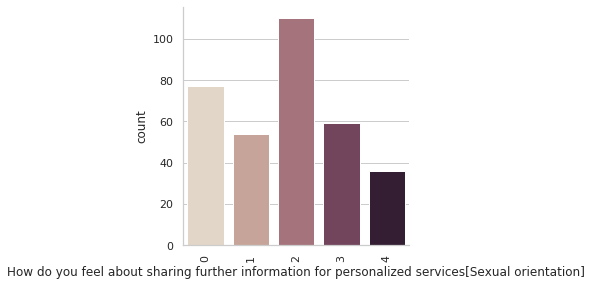

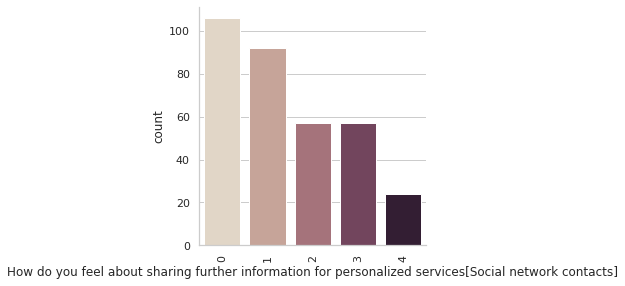

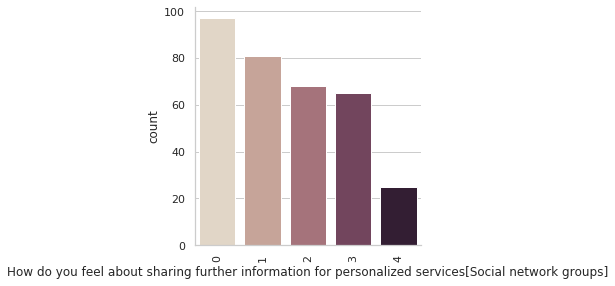

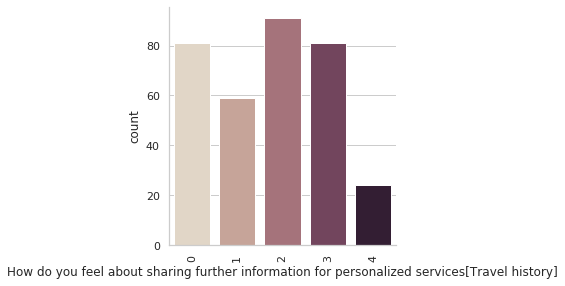

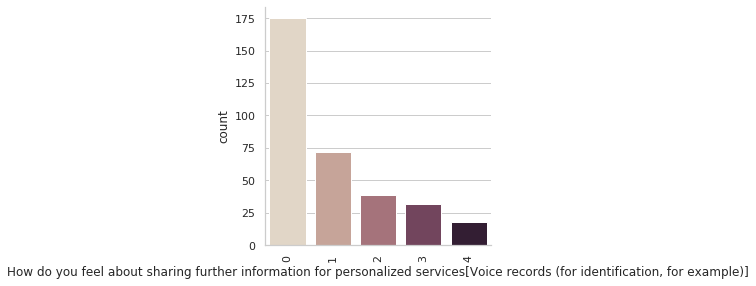

In [212]:
feel_about_sharing = [x for x in df.columns if x.startswith('How do you feel about sharing further information for personalized services[')]

for x in feel_about_sharing:
    
    clean[x] = df[x].copy()
    # Totally disagree
    clean.loc[
        (clean[x] == 'Totally disagree'), x] = int(0)

    # Disagree
    clean.loc[
        (clean[x] == 'Disagree'), x] = int(1)

    # Don't care and other
    clean.loc[
        (clean[x] == 'other') |
        (clean[x] == "Don't care") |
        (clean[x] == "Don\\'t care") |
        (clean[x].isnull()),
        x] = int(2)

    # Agree
    clean.loc[
        (clean[x] == 'Agree'), x] = int(3)

    # Absolutely agree
    clean.loc[
        (clean[x] == 'Absolutely agree'), x] = int(4)

    a = sns.catplot(x=x, kind="count", palette="ch:.25", data=clean, order = [0, 1, 2, 3, 4], height=4, aspect=1)
    a.set_xticklabels(rotation=90)

1.14) How do you feel about you are DONATING automatically the money to charities from selling your information[

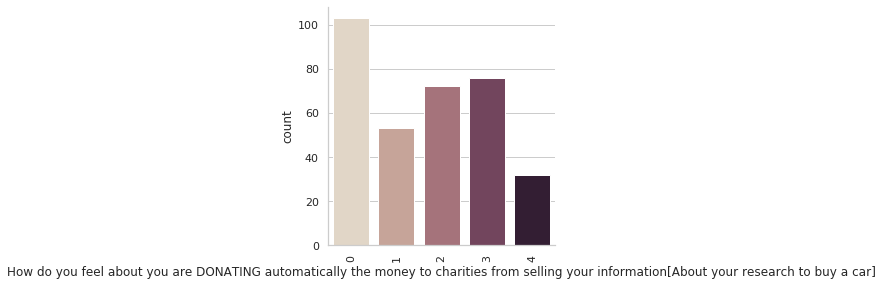

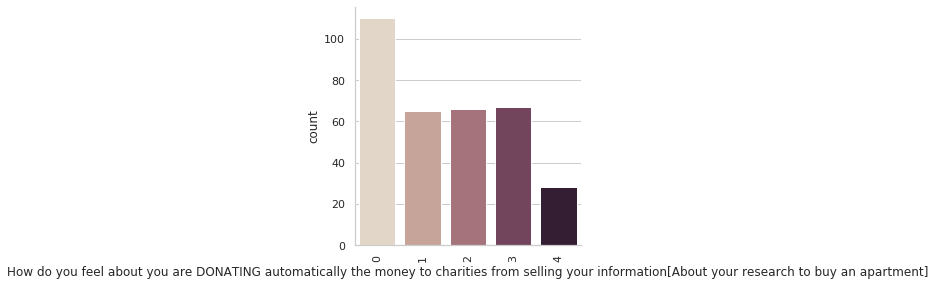

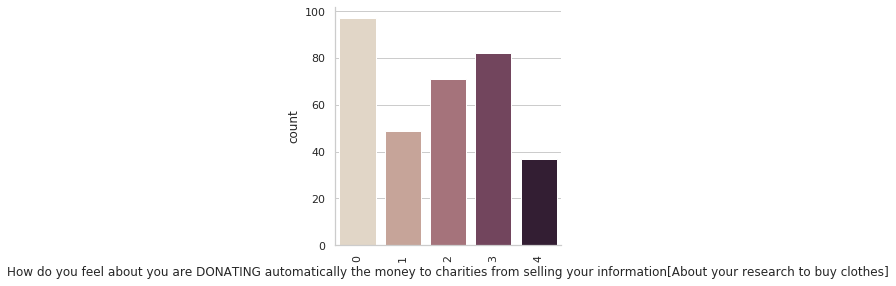

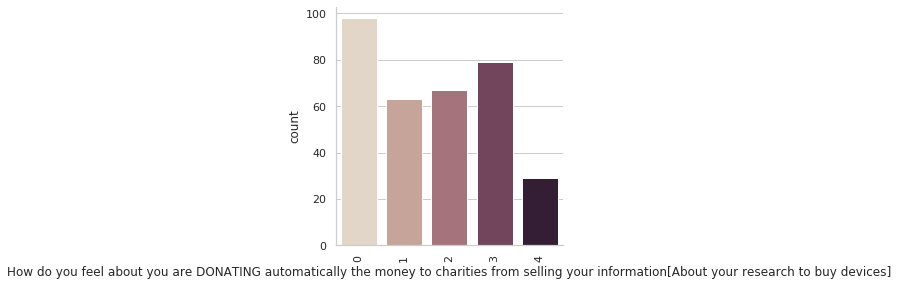

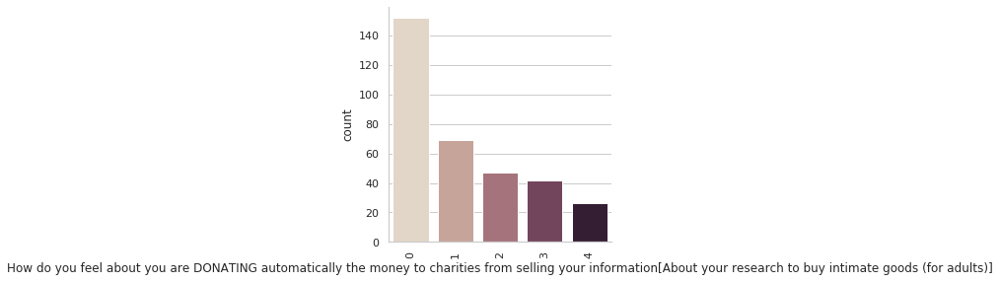

...

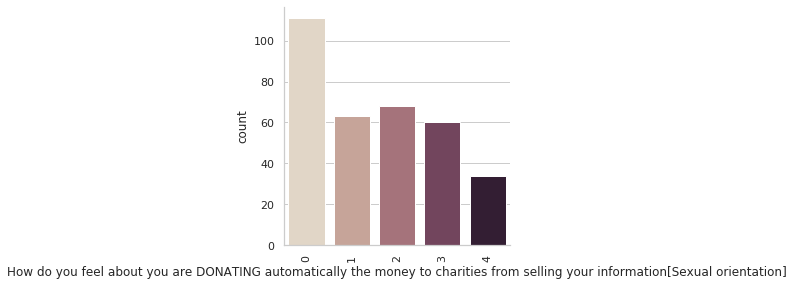

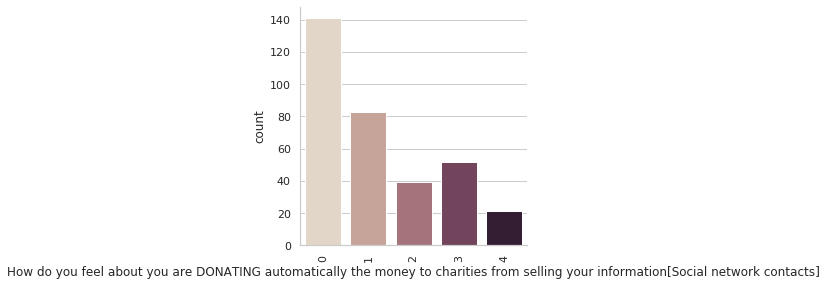

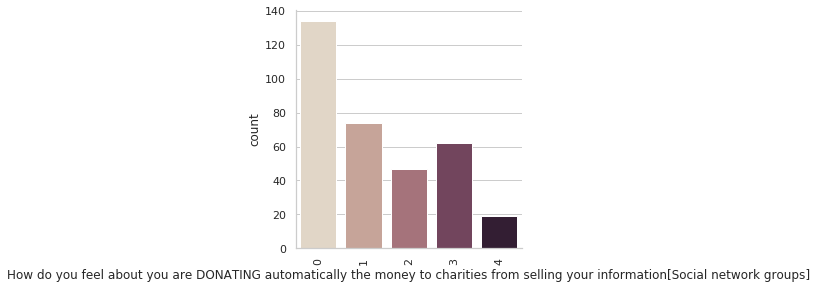

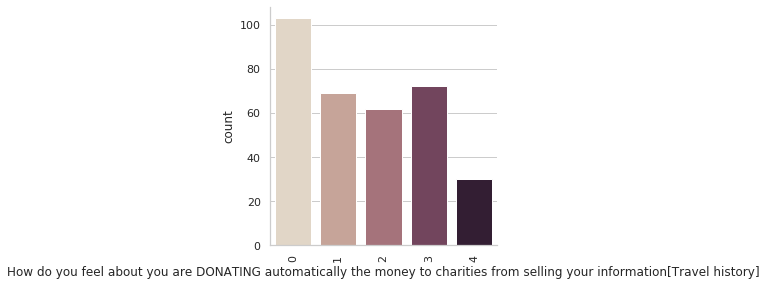

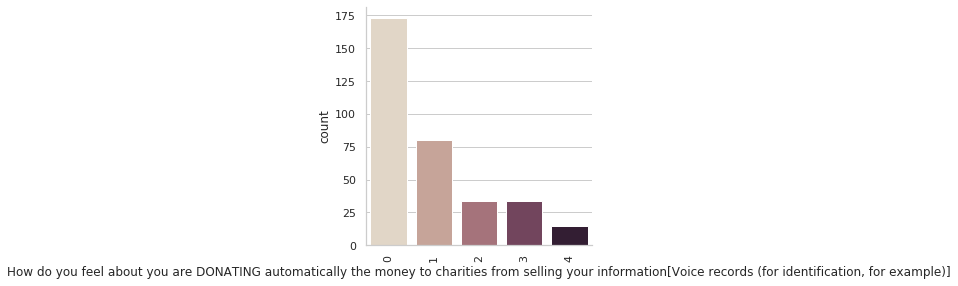

In [213]:
feel_about_donating = [x for x in df.columns if x.startswith('How do you feel about you are DONATING automatically the money to charities from selling your information[')]

for x in feel_about_donating:
    
    clean[x] = df[x].copy()
    # Totally disagree
    clean.loc[
        (clean[x] == 'Totally disagree'), x] = int(0)

    # Disagree
    clean.loc[
        (clean[x] == 'Disagree'), x] = int(1)

    # Don't care and other
    clean.loc[
        (clean[x] == 'other') |
        (clean[x] == "Don't care") |
        (clean[x] == "Don\\'t care") |
        (clean[x].isnull()),
        x] = int(2)

    # Agree
    clean.loc[
        (clean[x] == 'Agree'), x] = int(3)

    # Absolutely agree
    clean.loc[
        (clean[x] == 'Absolutely agree'), x] = int(4)

    a = sns.catplot(x=x, kind="count", palette="ch:.25", data=clean, order = [0, 1, 2, 3, 4], size=4, aspect=1)
    a.set_xticklabels(rotation=90)

1.15) How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[

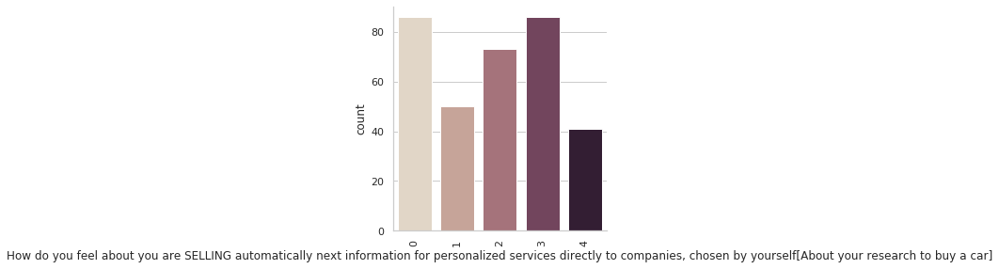

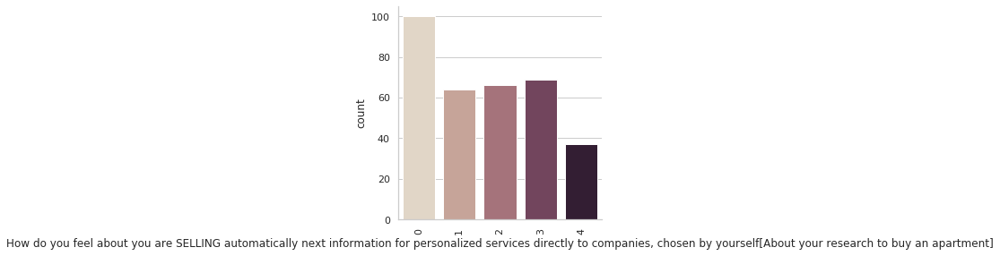

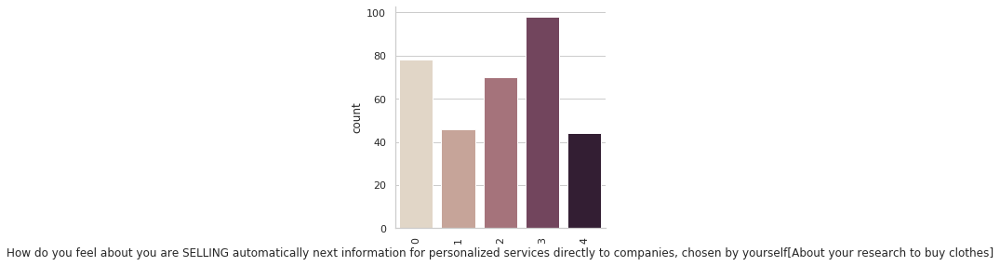

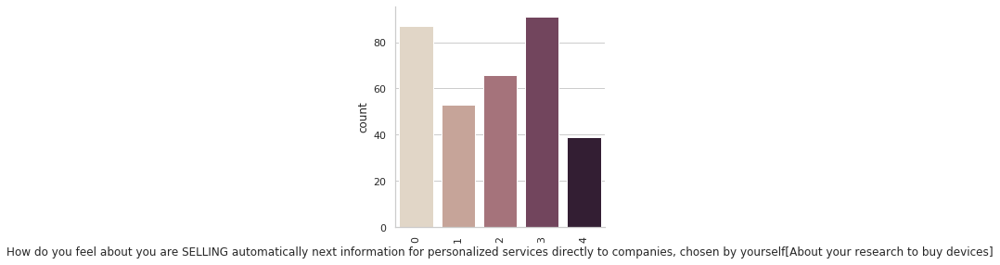

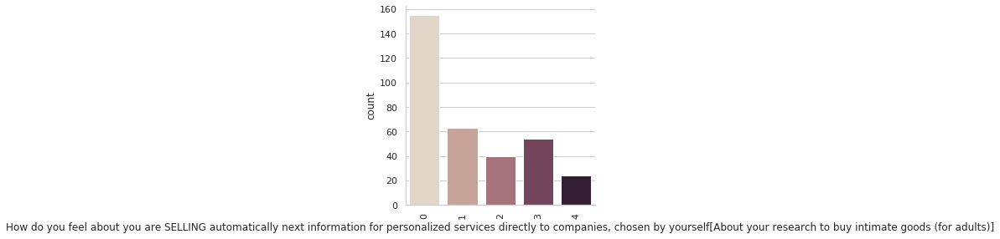

...

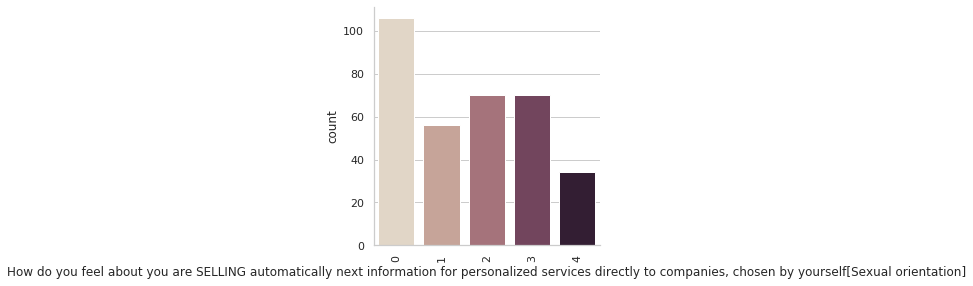

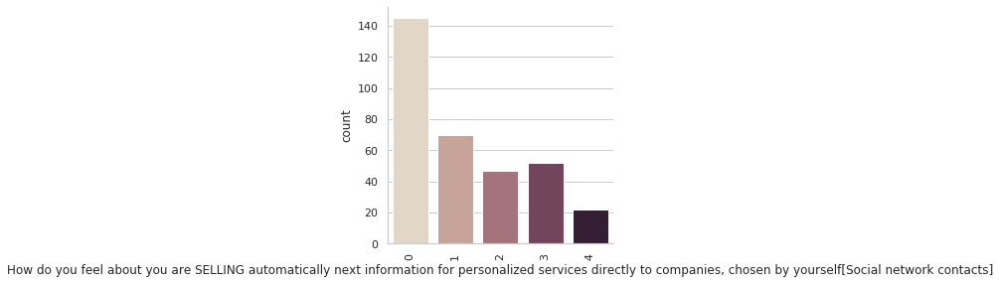

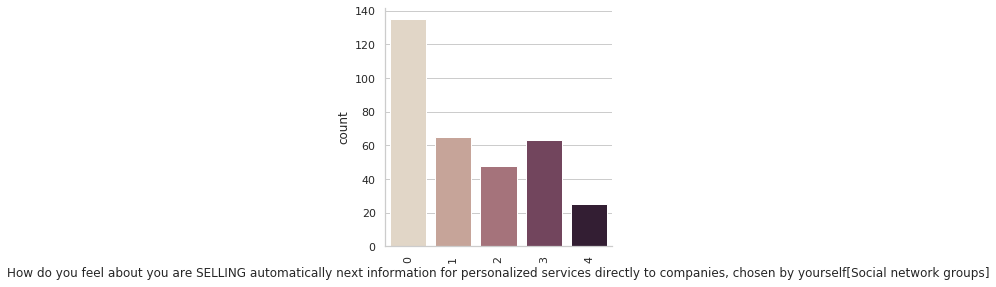

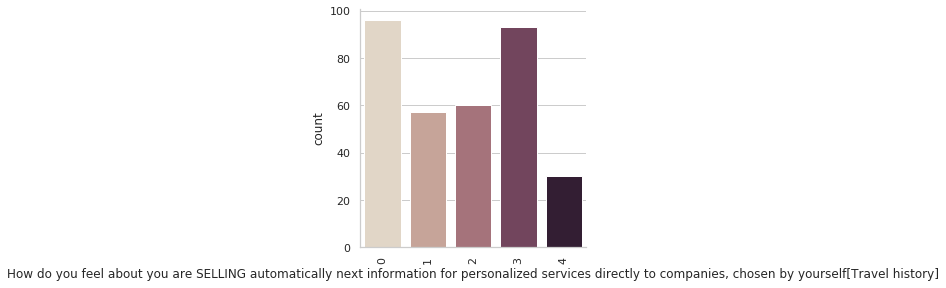

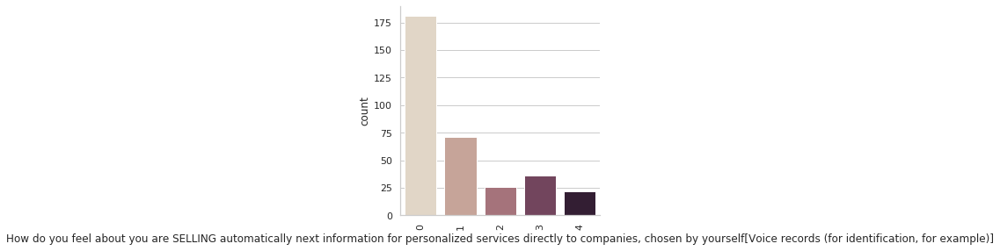

In [214]:
feel_about_selling = [x for x in df.columns if x.startswith('How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[')]

for x in feel_about_selling:
    
    clean[x] = df[x].copy()
    # Totally disagree
    clean.loc[
        (clean[x] == 'Totally disagree'), x] = int(0)

    # Disagree
    clean.loc[
        (clean[x] == 'Disagree'), x] = int(1)

    # Don't care and other
    clean.loc[
        (clean[x] == 'other') |
        (clean[x] == "Don't care") |
        (clean[x] == "Don\\'t care") |
        (clean[x].isnull()),
        x] = int(2)

    # Agree
    clean.loc[
        (clean[x] == 'Agree'), x] = int(3)

    # Absolutely agree
    clean.loc[
        (clean[x] == 'Absolutely agree'), x] = int(4)

    a = sns.catplot(x=x, kind="count", palette="ch:.25", data=clean, order = [0, 1, 2, 3, 4], height=4, aspect=1)
    a.set_xticklabels(rotation=90)

1.6) How do you value the following information[

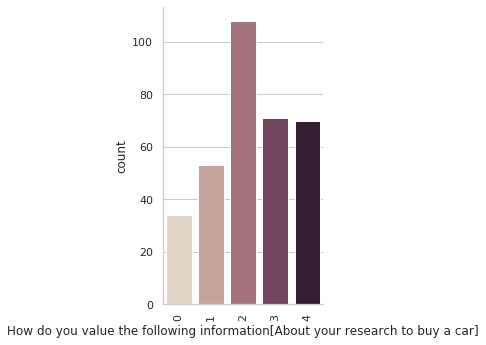

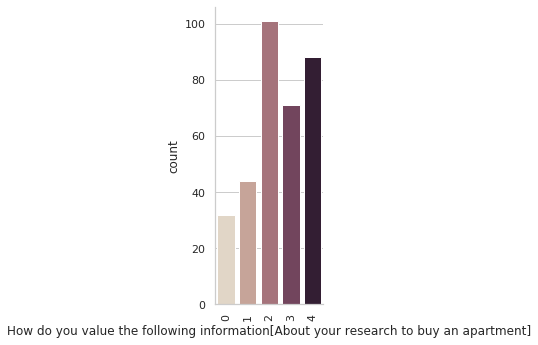

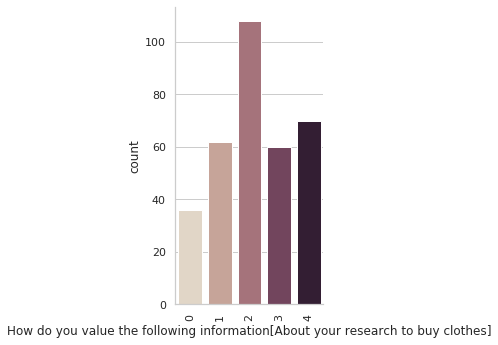

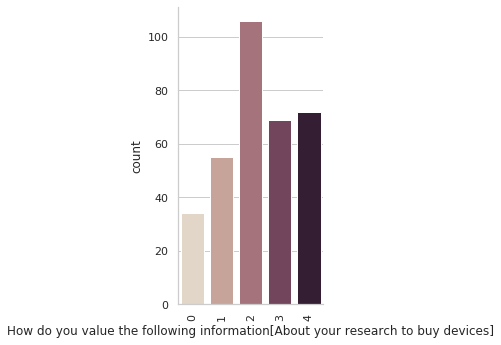

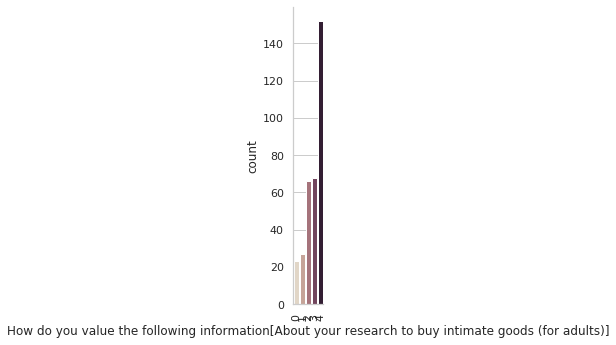

...

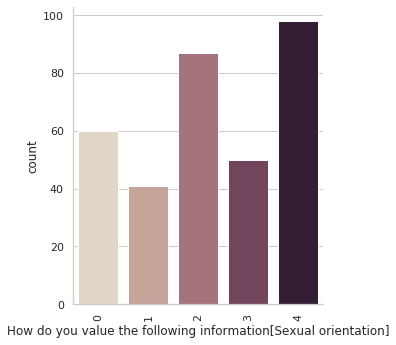

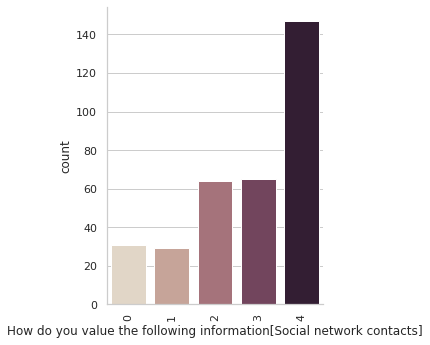

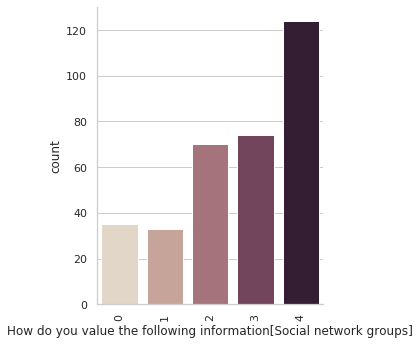

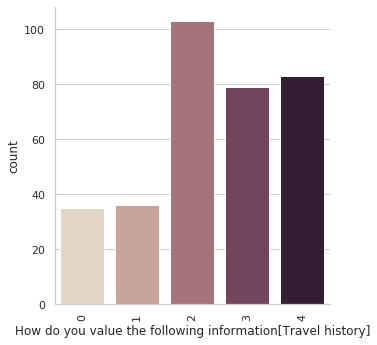

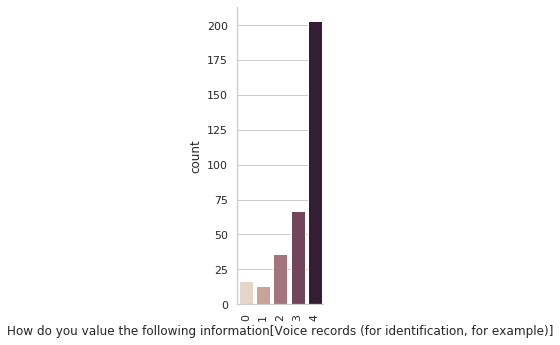

In [215]:
value_information = [x for x in df.columns if x.startswith('How do you value the following information[')]
    
for x in value_information:
    
    clean[x] = df[x].copy()
    
    # Free
    clean.loc[
        (clean[x] == 'Free'), x] = int(0)

    # Low cost
    clean.loc[
        (clean[x] == 'Low cost'), x] = int(1)

    # Average cost and other
    clean.loc[
        (clean[x] == 'Average cost') |
        (clean[x] == "other") |
        (clean[x].isnull()),
        x] = int(2)

    # Expensive
    clean.loc[
        (clean[x] == 'Expensive'), x] = int(3)

    # Not shareable
    clean.loc[
        (clean[x] == 'Not shareable'), x] = int(4)

    
    a = sns.catplot(x=x, kind="count", palette="ch:.25", data=clean,height=5, aspect=1)
    a.set_xticklabels(rotation=90)

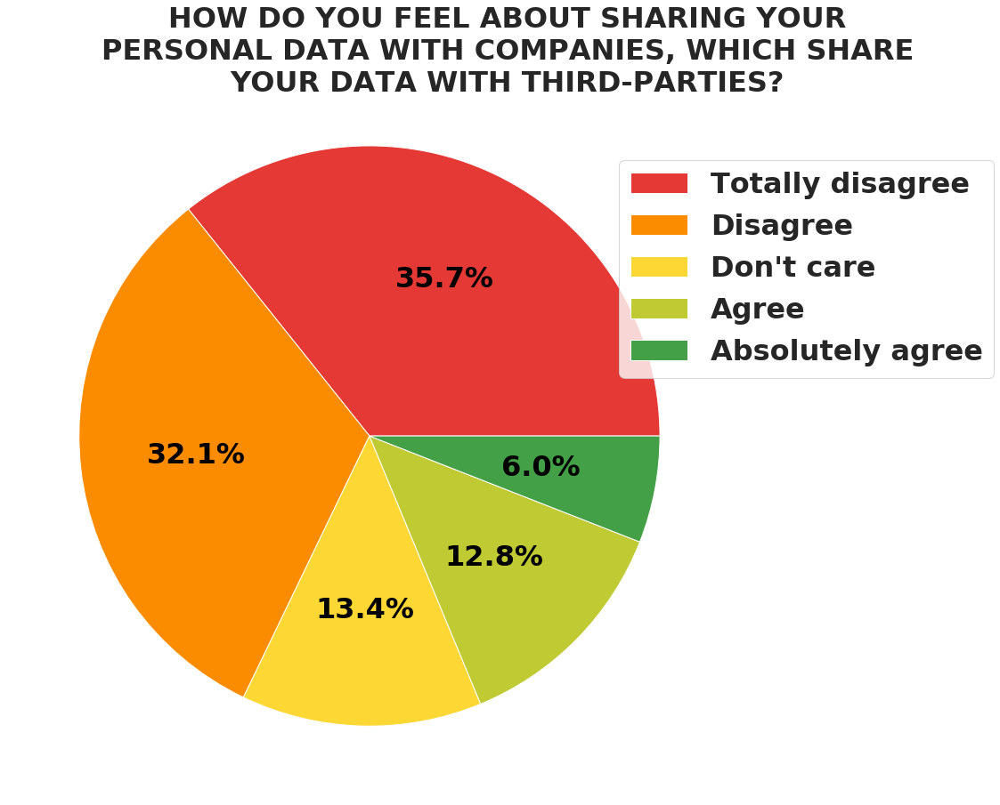

In [216]:
#BORIS
plot_pie(clean,
           col='How do you feel about ...?[sharing your personal data with companies, which share your data with third-parties (Often clause in terms of use)]',
           title='How do you feel about sharing your\npersonal data with companies, which share\nyour data with third-parties?',
           title_fontdict = {'fontsize':32,'weight':'bold'},
           color_idx=[0,14,12,11,9],
           labels= ['Totally disagree','Disagree',"Don't care",'Agree','Absolutely agree'], save=True)

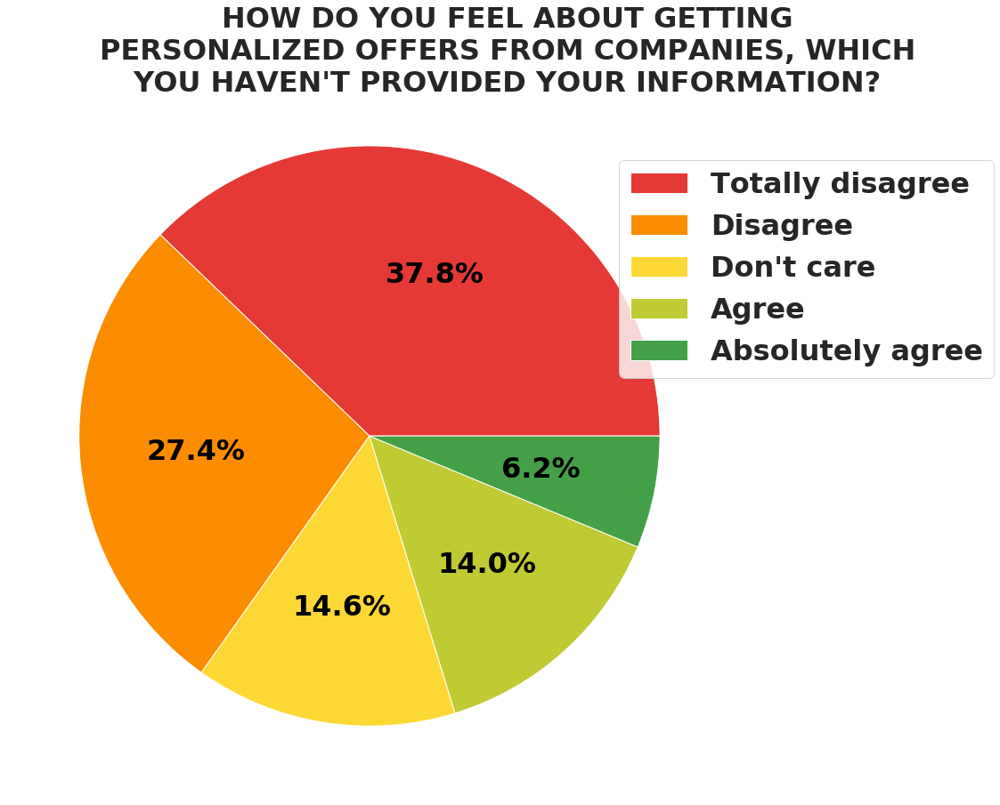

In [217]:
#BORIS
plot_pie(clean,
           col="How do you feel about ...?[getting personalized offers from companies, which you haven't provided your information?]",
           title="How do you feel about getting\npersonalized offers from companies, which\nyou haven't provided your information?",
           title_fontdict = {'fontsize':32,'weight':'bold'},
           color_idx=[0,14,12,11,9],
           labels= ['Totally disagree','Disagree',"Don't care",'Agree','Absolutely agree'], save=True)

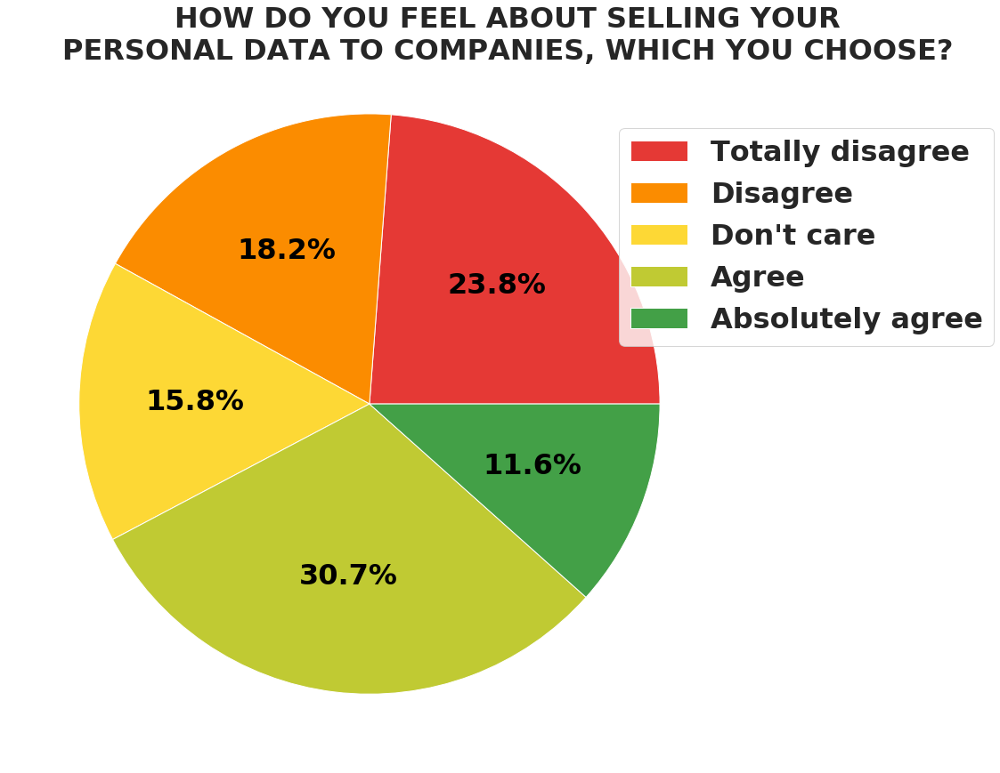

In [218]:
#BORIS
plot_pie(clean,
           col='How do you feel about ...?[selling your personal data to companies, which  you choose]',
           title='How do you feel about selling your\npersonal data to companies, which you choose?',
           title_fontdict = {'fontsize':32,'weight':'bold'},
           color_idx=[0,14,12,11,9],
           labels= ['Totally disagree','Disagree',"Don't care",'Agree','Absolutely agree'], save=True)

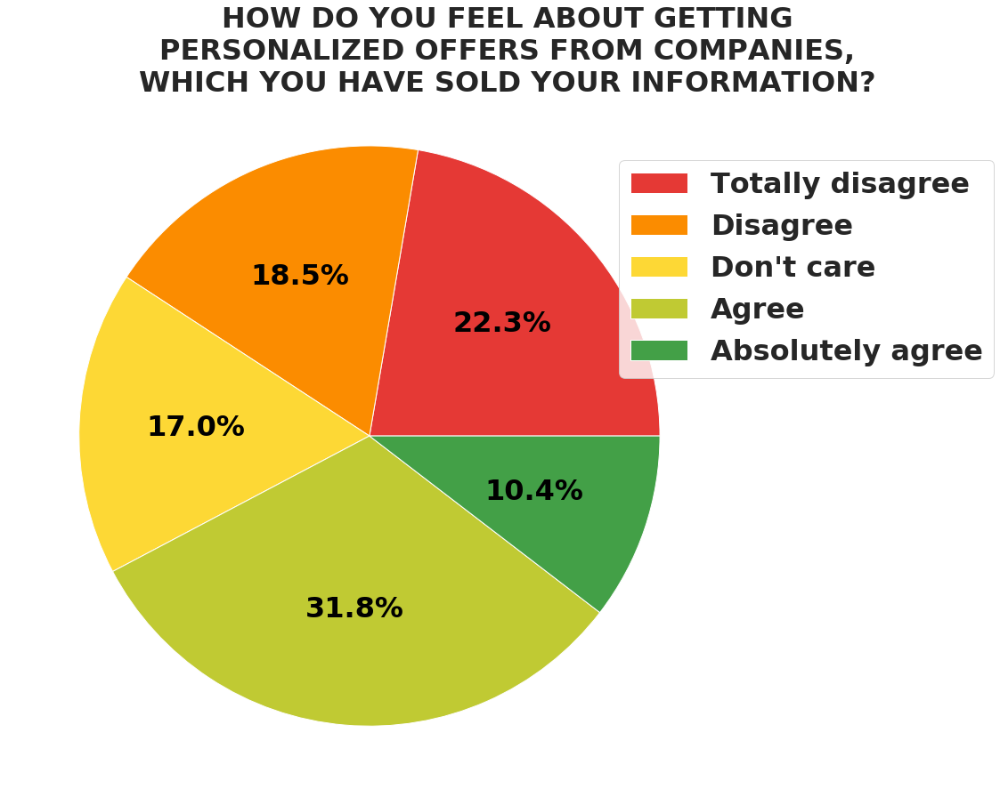

In [219]:
#BORIS
plot_pie(clean,
           col='How do you feel about ...?[getting personalized offers from companies, which you have sold your information?]',
           title='How do you feel about getting\npersonalized offers from companies,\nwhich you have sold your information?',
           title_fontdict = {'fontsize':32,'weight':'bold'},
           color_idx=[0,14,12,11,9],
           labels= ['Totally disagree','Disagree',"Don't care",'Agree','Absolutely agree'], save=True)

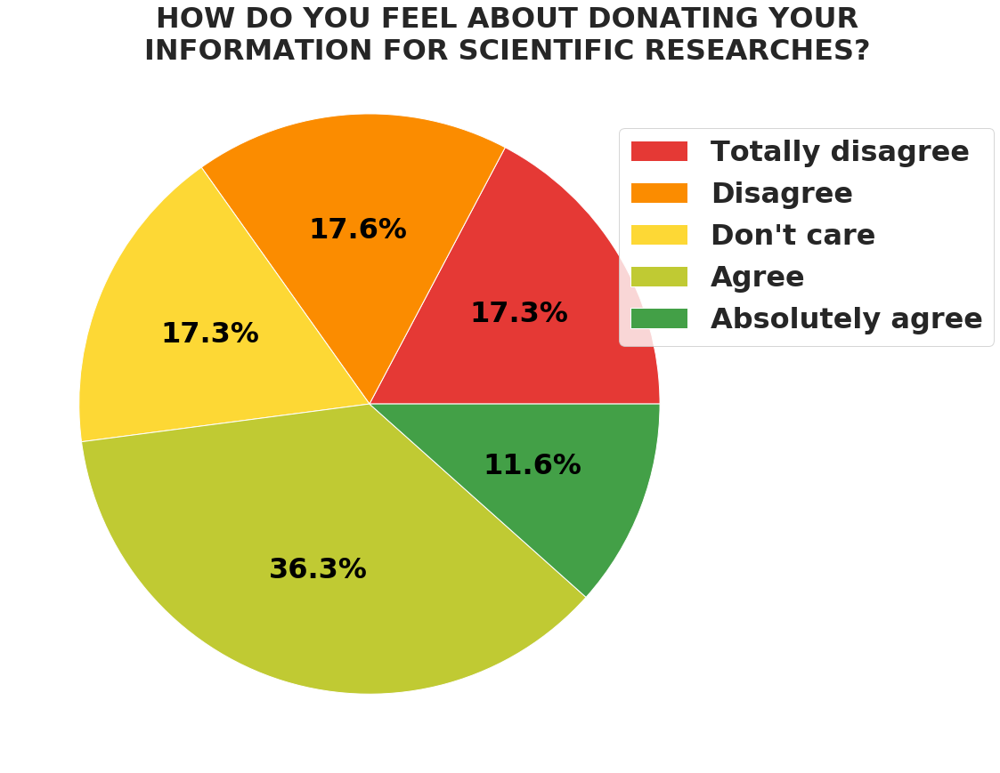

In [220]:
#BORIS
plot_pie(clean,
           col='How do you feel about ...?[donating your information for scientific researches]',
           title='How do you feel about donating your\ninformation for scientific researches?',
           title_fontdict = {'fontsize':32,'weight':'bold'},
           color_idx=[0,14,12,11,9],
           labels= ['Totally disagree','Disagree',"Don't care",'Agree','Absolutely agree'], save=True)

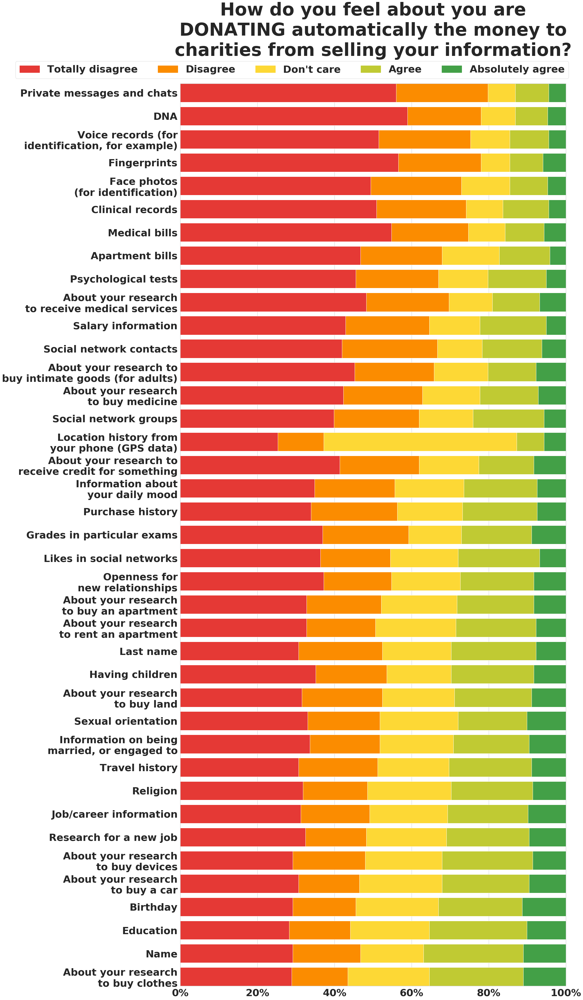

In [221]:
#BORIS
beg = 'How do you feel about you are DONATING automatically the money to charities from selling your information['
feel_about = [x for x in df.columns if x.startswith(beg)]
sns.set(style="whitegrid")
dfB = clean[feel_about].apply(pd.Series.value_counts)
dfB.loc[:,:] = (dfB.values / dfB.sum(axis=0).values).cumsum(axis=0)
sort_order = pd.Series((dfB.index.values[:,np.newaxis] * dfB.values).sum(axis=0),index=dfB.columns)
sort_order.sort_values(inplace=True)
y_labels = re.findall('\[([^\]]*)\]','\t'.join(list(sort_order.index.values)))
for j in range(len(y_labels)):
    if len(y_labels[j]) > 26:
        words = y_labels[j].split(' ')
        n_words = len(words)
        y_labels[j] = '\n'.join([' '.join(words[:n_words//2]),' '.join(words[n_words//2:])])
dfB = dfB[sort_order.index.values]
plt.figure(figsize=(25,60))
new_hs = list()
for answer in [4,3,2,1,0]:
    color_dict = {0:0, 1:14, 2:12, 3:11, 4:9}
    labels_dict = {0: 'Totally disagree', 1: 'Disagree', 2: "Don't care", 3: 'Agree', 4: 'Absolutely agree'}
    plt.barh(y_labels,width=dfB.loc[answer,:]*100,
             color=COLORS[color_dict[answer]],height=0.8)
    new_hs.append(mpatches.Patch(color=COLORS[color_dict[answer]], label=labels_dict[answer]))
new_hs.reverse()
x_ticks = list(plt.xticks()[0])
x_labels = ['{:.0f}%'.format(x) for x in x_ticks if x <= 100]
plt.xticks(ticks=x_ticks,labels=x_labels, fontsize=36, fontweight='bold')
plt.yticks(fontsize=36, fontweight='bold')
plt.title('How do you feel about you are\nDONATING automatically the money to\ncharities from selling your information?',
          fontdict={'fontsize':64,'weight':'bold'},pad=100)
plt.xlim((0,100))
plt.margins(y=0)
plt.legend(handles=new_hs, prop={'weight':'bold','size':36}, loc='lower left', bbox_to_anchor=(-0.44,1),ncol=5)
plt.savefig('How_do_you_feel_about_you_are_DONATING.png',bbox_inches='tight')
plt.show()

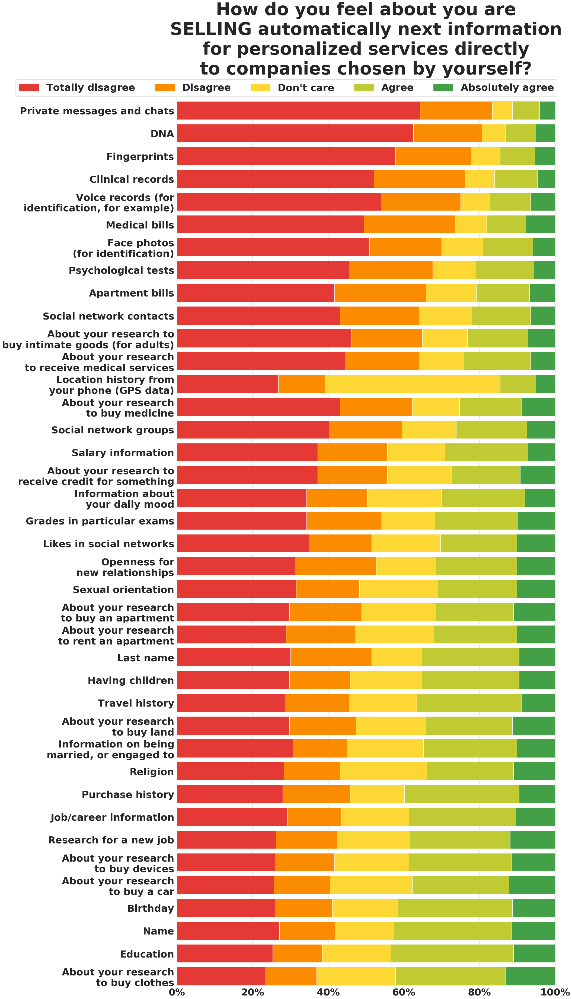

In [222]:
#BORIS
beg = 'How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself['
feel_about = [x for x in df.columns if x.startswith(beg)]
sns.set(style="whitegrid")
dfB = clean[feel_about].apply(pd.Series.value_counts)
dfB.loc[:,:] = (dfB.values / dfB.sum(axis=0).values).cumsum(axis=0)
sort_order = pd.Series((dfB.index.values[:,np.newaxis] * dfB.values).sum(axis=0),index=dfB.columns)
sort_order.sort_values(inplace=True)
y_labels = re.findall('\[([^\]]*)\]','\t'.join(list(sort_order.index.values)))
for j in range(len(y_labels)):
    if len(y_labels[j]) > 26:
        words = y_labels[j].split(' ')
        n_words = len(words)
        y_labels[j] = '\n'.join([' '.join(words[:n_words//2]),' '.join(words[n_words//2:])])
dfB = dfB[sort_order.index.values]
plt.figure(figsize=(25,60))
new_hs = list()
for answer in [4,3,2,1,0]:
    color_dict = {0:0, 1:14, 2:12, 3:11, 4:9}
    labels_dict = {0: 'Totally disagree', 1: 'Disagree', 2: "Don't care", 3: 'Agree', 4: 'Absolutely agree'}
    plt.barh(y_labels,width=dfB.loc[answer,:]*100,
             color=COLORS[color_dict[answer]],height=0.8)
    new_hs.append(mpatches.Patch(color=COLORS[color_dict[answer]], label=labels_dict[answer]))
new_hs.reverse()
x_ticks = list(plt.xticks()[0])
x_labels = ['{:.0f}%'.format(x) for x in x_ticks if x <= 100]
plt.xticks(ticks=x_ticks,labels=x_labels, fontsize=36, fontweight='bold')
plt.yticks(fontsize=36, fontweight='bold')
plt.title('How do you feel about you are\nSELLING automatically next information\nfor personalized services directly\nto companies chosen by yourself?',
          fontdict={'fontsize':64,'weight':'bold'},pad=100)
plt.xlim((0,100))
plt.margins(y=0)
plt.legend(handles=new_hs, prop={'weight':'bold','size':36}, loc='lower left', bbox_to_anchor=(-0.44,1),ncol=5)
plt.savefig('How_do_you_feel_about_you_are_SELLING.png',bbox_inches='tight')
plt.show()

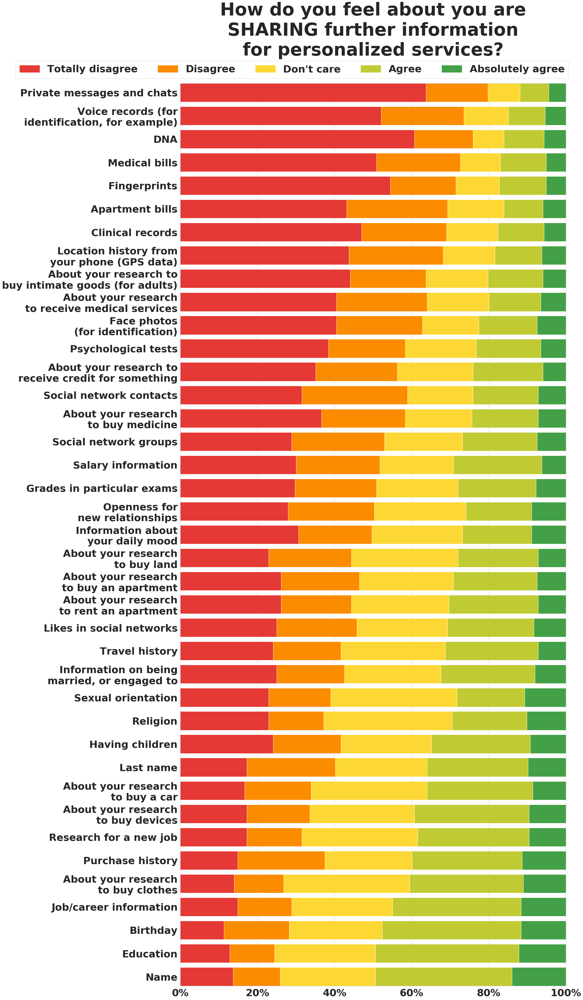

In [223]:
#BORIS
beg = 'How do you feel about sharing further information for personalized services['
feel_about = [x for x in df.columns if x.startswith(beg)]
sns.set(style="whitegrid")
dfB = clean[feel_about].apply(pd.Series.value_counts)
dfB.loc[:,:] = (dfB.values / dfB.sum(axis=0).values).cumsum(axis=0)
sort_order = pd.Series((dfB.index.values[:,np.newaxis] * dfB.values).sum(axis=0),index=dfB.columns)
sort_order.sort_values(inplace=True)
y_labels = re.findall('\[([^\]]*)\]','\t'.join(list(sort_order.index.values)))
for j in range(len(y_labels)):
    if len(y_labels[j]) > 26:
        words = y_labels[j].split(' ')
        n_words = len(words)
        y_labels[j] = '\n'.join([' '.join(words[:n_words//2]),' '.join(words[n_words//2:])])
dfB = dfB[sort_order.index.values]
plt.figure(figsize=(25,60))
new_hs = list()
for answer in [4,3,2,1,0]:
    color_dict = {0:0, 1:14, 2:12, 3:11, 4:9}
    labels_dict = {0: 'Totally disagree', 1: 'Disagree', 2: "Don't care", 3: 'Agree', 4: 'Absolutely agree'}
    plt.barh(y_labels,width=dfB.loc[answer,:]*100,
             color=COLORS[color_dict[answer]],height=0.8)
    new_hs.append(mpatches.Patch(color=COLORS[color_dict[answer]], label=labels_dict[answer]))
new_hs.reverse()
x_ticks = list(plt.xticks()[0])
x_labels = ['{:.0f}%'.format(x) for x in x_ticks if x <= 100]
plt.xticks(ticks=x_ticks,labels=x_labels, fontsize=36, fontweight='bold')
plt.yticks(fontsize=36, fontweight='bold')
plt.title('How do you feel about you are\nSHARING further information\nfor personalized services?',
          fontdict={'fontsize':64,'weight':'bold'},pad=100)
plt.xlim((0,100))
plt.margins(y=0)
plt.legend(handles=new_hs, prop={'weight':'bold','size':36}, loc='lower left', bbox_to_anchor=(-0.44,1),ncol=5)
plt.savefig('How_do_you_feel_about_you_are_SHARING.png',bbox_inches='tight')
plt.show()

In [224]:
#BORIS
begs = {'Selling':'How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself[',
        'Donating':'How do you feel about you are DONATING automatically the money to charities from selling your information[',
        'Sharing':'How do you feel about sharing further information for personalized services['}
cols = list(begs.keys())
items = [re.findall('\[([^\]]*)\]',x)[0] for x in feel_about]
df_proba = pd.DataFrame(columns = cols, index = items)
for col in cols:
    for data in items:
        df_values = clean['{0}{1}]'.format(begs[col],data)].value_counts()
        df_proba.loc[data,col] = (df_values[3]+df_values[4])/df_values.sum()
df_proba = df_proba.astype(float)
df_proba['Avg'] = df_proba.mean(axis=1)
df_proba.sort_values('Avg',ascending=True,inplace=True)

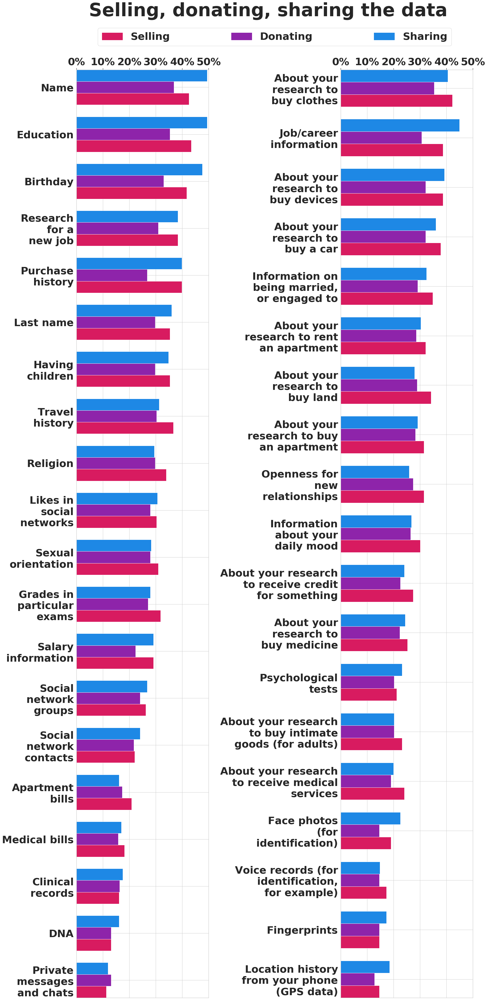

In [226]:
#BORIS
def label_to_2_lines(label):
    words = label.split(' ')
    line1 = ''
    line2 = ''
    while len(words) > 0:
        if len(line1) <= len(line2):
            if len(line1) > 0:
                line1 += ' '
            line1 += words.pop(0)
        else:
            if len(line2) > 0:
                line2 = ' ' + line2
            line2 = words.pop(-1) + line2
    return line1 + '\n' + line2
def label_to_n_lines(label, n_lines=3):
    target_len = np.ceil(len(label) / n_lines)
    words = label.split(' ')
    target_len = max(target_len, np.array([len(x) for x in words]).max())
    got_result = False
    while not got_result:
        words = label.split(' ')
        lines = []
        line = words.pop(0)
        while len(words) > 0:
            if len(line) + len(words[0]) + 1 > target_len:
                lines.append(line)
                line = words.pop(0)
            else:
                line += ' ' + words.pop(0)
        else:
            lines.append(line)
        if len(lines) <= n_lines:
            got_result = True
        else:
            target_len += 1
    return '\n'.join(lines)
    
df_labels = pd.DataFrame({'original label':df_proba.index.to_series()})
df_labels['3 lines label'] = df_labels['original label'].apply(lambda x: label_to_n_lines(x))
df_labels['3 lines label len'] = df_labels['3 lines label'].apply(lambda x: max([len(y) for y in x.split('\n')]))
df_labels.sort_values(['3 lines label len','original label'],ascending=[True,False],inplace=True)
df_labels.reset_index(drop=True,inplace=True)
shortlabels = df_labels['original label'].values[:20]
sns.set(style="whitegrid") 
shortlabels_mask = df_proba.index.to_series().isin(shortlabels)
df_proba_shortlabels = df_proba.loc[shortlabels_mask,:]
df_proba_longlabels = df_proba.loc[np.logical_not(shortlabels_mask),:]


fig,axes = plt.subplots(1,2,figsize=(25,60))
for ax, dfp in zip(axes,[df_proba_shortlabels,df_proba_longlabels]):
    y_labels = list(dfp.index.values)
    if ax == axes[0]:
        for j in range(len(y_labels)):
            if len(y_labels[j]) > 20:
                y_labels[j] = label_to_n_lines(y_labels[j],n_lines=3)
            elif ' ' in y_labels[j] and len(y_labels[j]) > 13:
                y_labels[j] = label_to_2_lines(y_labels[j])
    else:
        for j in range(len(y_labels)):
            y_labels[j] = label_to_n_lines(y_labels[j],n_lines=3)
    new_hs = list()
    for j, ing in enumerate(cols):
        color_dict = {'Selling':1, 'Donating':2, 'Sharing':5}
        ax.barh(np.arange(len(y_labels))+0.25*(j-1),width=dfp.loc[:,ing]*100,
                 color=COLORS[color_dict[ing]],height=0.25)
        new_hs.append(mpatches.Patch(color=COLORS[color_dict[ing]], label=ing))
    ax.set_xlim((0,50))
    x_labels = list(ax.get_xticks())
    x_labels = ['{}%'.format(int(x)) for x in x_labels]
    ax.set_xticklabels(x_labels,fontdict={'fontsize':36, 'fontweight':'bold'})
    ax.xaxis.tick_top()
    #ax[0].yticks(ticks=np.arange(len(y_labels)), labels=y_labels, fontsize=36, fontweight='bold')
    ax.set_yticks(np.arange(len(y_labels)))
    ax.set_yticklabels(y_labels, fontdict={'fontsize':36, 'fontweight':'bold'})
    ax.margins(y=0)
fig.suptitle('Selling, donating, sharing the data',
              fontsize=64,fontweight='bold',y=0.935)
plt.legend(handles=new_hs, prop={'weight':'bold','size':36}, loc='lower center', bbox_to_anchor=(-0.5,1.02),
           ncol=3,columnspacing=6)
plt.subplots_adjust(wspace=1)
plt.savefig('Probabilities.png',bbox_inches='tight')
plt.show()

In [229]:
df.to_csv('df.csv')

In [230]:
clean.columns.values

array(['Age', 'gender', 'country', 'position', 'sector', 'industry',
       'net_earnings', 'household_income',
       'How do you feel about ...?[donating your information for scientific researches]',
       'How do you feel about ...?[getting personalized offers from companies, which you have sold your information?]',
       "How do you feel about ...?[getting personalized offers from companies, which you haven't provided your information?]",
       'How do you feel about ...?[selling your personal data to companies, which  you choose]',
       'How do you feel about ...?[sharing your personal data with companies, which share your data with third-parties (Often clause in terms of use)]',
       'How do you feel about sharing further information for personalized services[About your research to buy a car]',
       'How do you feel about sharing further information for personalized services[About your research to buy an apartment]',
       'How do you feel about sharing further informat

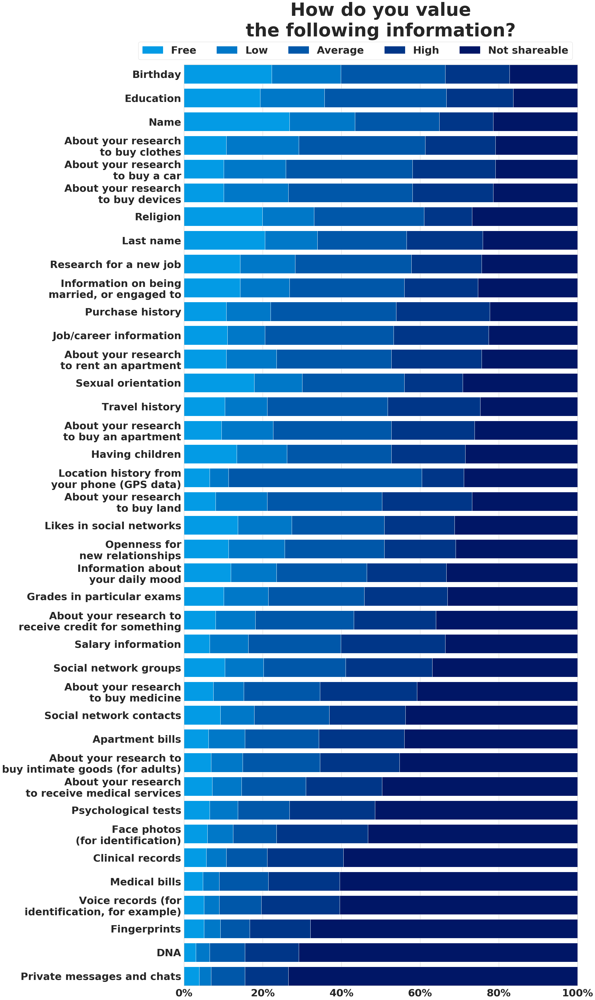

In [231]:
#BORIS
beg = 'How do you value the following information['
feel_about = [x for x in clean.columns if x.startswith(beg)]
sns.set(style="whitegrid")
dfB = clean[feel_about].apply(pd.Series.value_counts)
dfB.loc[:,:] = (dfB.values / dfB.sum(axis=0).values).cumsum(axis=0)
sort_order = pd.Series((dfB.index.values[:,np.newaxis] * dfB.values).sum(axis=0),index=dfB.columns)
sort_order.sort_values(inplace=True)
y_labels = re.findall('\[([^\]]*)\]','\t'.join(list(sort_order.index.values)))


for j in range(len(y_labels)):
    if len(y_labels[j]) > 26:
        words = y_labels[j].split(' ')
        n_words = len(words)
        y_labels[j] = '\n'.join([' '.join(words[:n_words//2]),' '.join(words[n_words//2:])])
dfB = dfB[sort_order.index.values]
plt.figure(figsize=(25,60))
new_hs = list()
for answer in [4,3,2,1,0]:
    color_dict = {0:'#039BE5', 1:'#0078C8', 2:'#0057A9', 3:'#003688', 4:'#001666'}
    labels_dict = {0: 'Free', 1: 'Low', 2: "Average", 3: 'High', 4: 'Not shareable'}
    plt.barh(y_labels,width=dfB.loc[answer,:]*100,
             color=color_dict[answer],height=0.8)
    new_hs.append(mpatches.Patch(color=color_dict[answer], label=labels_dict[answer]))
new_hs.reverse()
x_ticks = list(plt.xticks()[0])
x_labels = ['{:.0f}%'.format(x) for x in x_ticks if x <= 100]
plt.xticks(ticks=x_ticks,labels=x_labels, fontsize=36, fontweight='bold')
plt.yticks(fontsize=36, fontweight='bold')
plt.title('How do you value\nthe following information?',
          fontdict={'fontsize':64,'weight':'bold'},pad=100)
plt.xlim((0,100))
plt.margins(y=0)
plt.legend(handles=new_hs, prop={'weight':'bold','size':36}, loc='lower right', bbox_to_anchor=(1,1),ncol=5)
plt.savefig('How_do_you_VALUE.png',bbox_inches='tight')
plt.show()

# QUESTIONS

In [232]:
# descriptive plot function
def plot_violin(data, col, y, palette):
    for x in col:
        sns.catplot(x, y, kind="violin", inner='box', palette=palette, data=data, split=True)
        plt.title(x + ' VS ' + y)
        plt.xlabel(x)
        plt.ylabel(y)
        plt.xticks(rotation=90)

# function for partial residuals
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--')

def plot_partial_residual(res, col):
    fig = res.plot_partial_residuals(col)


    col_beta = res.params[col] 
    ax = fig.get_axes()[0]
    #ax.plot((0.0,1), (0, col_beta))
    abline(col_beta, 0)
    ax.get_lines()[0].set_alpha(0.5)

# Note: uses sm.families.NegativeBinomial to fit alpha, then use glm for convenience    
def negativeBinomial(formula, data, method='bfgs', iter=5000):
    print('negative binomial')
    y, X = patsy.dmatrices(formula, data=data, return_type='dataframe')

    mod = sm.NegativeBinomial(y, X)
    res = mod.fit(maxiter=iter, maxfun=iter, method=method)

    mod.mu = res.predict()
    display(res.summary())
    alpha = math.exp(res.lnalpha)
    return smf.glm(formula=formula, data=data, family=sm.families.NegativeBinomial(sm.families.links.log, alpha=alpha))

def print_log_effect(res, col):
    print('baseline: {:.2f} ±{:.2f}, effect: {:.2f}% ±{:.2f}%'.format(math.exp(res.params['Intercept']), 
                                        math.exp(res.bse['Intercept']),
                                        (math.exp(res.params[col])-1)*100, 
                                        (math.exp(res.bse[col])-1)*100,
                                       ))

In [233]:
# definition of personalization
df['What do you think the definition of “personalization” is?'].value_counts()
replace = {
    'receiving recommendations based on my usage history (past history),receiving recommendations based on my intention to buy something (future impact),customizing user interface or service workflow taking into account my preferences':'receiving recommendations based on my usage history (past history);receiving recommendations based on my intention to buy something (future impact);customizing user interface or service workflow taking into account my preferences',
    'receiving recommendations based on my usage history (past history),receiving recommendations based on my intention to buy something (future impact)':'receiving recommendations based on my usage history (past history);receiving recommendations based on my intention to buy something (future impact)',
    'receiving recommendations based on my usage history (past history),customizing user interface or service workflow taking into account my preferences':'receiving recommendations based on my usage history (past history);customizing user interface or service workflow taking into account my preferences',
'receiving recommendations based on my intention to buy something (future impact),customizing user interface or service workflow taking into account my preferences':'receiving recommendations based on my intention to buy something (future impact);customizing user interface or service workflow taking into account my preferences',
None: ''
}
foo = df['What do you think the definition of “personalization” is?'].replace(replace)

In [234]:
foo.value_counts()

customizing user interface or service workflow taking into account my preferences                                                                                                                                                                                                                                                                                                        124
receiving recommendations based on my usage history (past history)                                                                                                                                                                                                                                                                                                                        82
receiving recommendations based on my intention to buy something (future impact)                                                                                                                                                              

In [235]:
sorted(set(z.strip() for y in foo.str.split(';') for z in y))

['All of the above',
 "I don't know",
 "I'm not sure",
 'If I had to choose only 1, I would choose custom ui. Iâ\x80\x99m choosing all because I feel they are different levels or types of personalization',
 'No idea',
 'Usage of personal details, demographics to customise messaging',
 'customizing user interface or service workflow taking into account my preferences',
 'customizing user interface or service workflow taking into account my preferences,homemaker',
 'receiving recommendations based on my intention to buy something (future impact)',
 'receiving recommendations based on my usage history (past history)',
 'whatever a company decides']

In [236]:

personalization=[
 'customizing user interface or service workflow taking into account my preferences',
 'receiving recommendations based on my intention to buy something (future impact)',
 'receiving recommendations based on my usage history (past history)']
for c in personalization:
    clean[c] = df['What do you think the definition of “personalization” is?'].apply(lambda s: c in s if s else False)
display(clean[personalization].mean())
display(clean[personalization].std())

customizing user interface or service workflow taking into account my preferences    0.598214
receiving recommendations based on my intention to buy something (future impact)     0.315476
receiving recommendations based on my usage history (past history)                   0.505952
dtype: float64

customizing user interface or service workflow taking into account my preferences    0.490990
receiving recommendations based on my intention to buy something (future impact)     0.465398
receiving recommendations based on my usage history (past history)                   0.500710
dtype: float64

In [237]:
clean.to_csv('clean.csv')
print(clean.shape)
clean.head()

(336, 172)


,Age,gender,country,position,sector,industry,net_earnings,household_income,How do you feel about ...?[donating your information for scientific researches],"How do you feel about ...?[getting personalized offers from companies, which you have sold your information?]",...,How do you value the following information[Research for a new job],How do you value the following information[Salary information],How do you value the following information[Sexual orientation],How do you value the following information[Social network contacts],How do you value the following information[Social network groups],How do you value the following information[Travel history],"How do you value the following information[Voice records (for identification, for example)]",customizing user interface or service workflow taking into account my preferences,receiving recommendations based on my intention to buy something (future impact),receiving recommendations based on my usage history (past history)
0,43,Female,United States,homemaker,none,unemployed,"(40000, 70000)","(55000, 59999)",0,2,...,2,2,2,4,4,2,2,False,False,True
1,33,Female,United States,student,none,education,"(40000, 70000)","(50000, 54999)",2,2,...,2,3,1,1,1,2,2,False,True,False
2,54,Female,United States,retiree,other,non-profit,"(0, 40000)","(15000, 19999)",1,1,...,0,0,0,1,0,4,0,True,False,False
3,65,Male,United States,retiree,none,retired,"(0, 40000)","(20000, 24999)",1,1,...,2,4,4,2,2,2,2,True,False,False
4,35,Male,United States,manager,management,manufacturing,"(70000, 150000)","(20000, 24999)",3,3,...,0,3,0,2,1,3,1,True,False,False


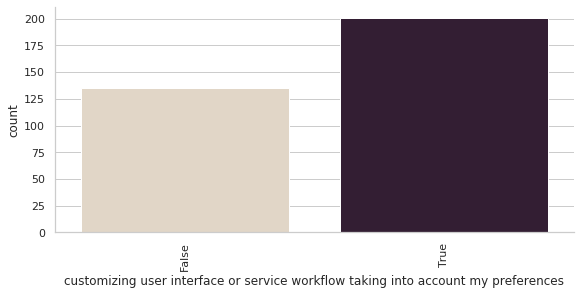

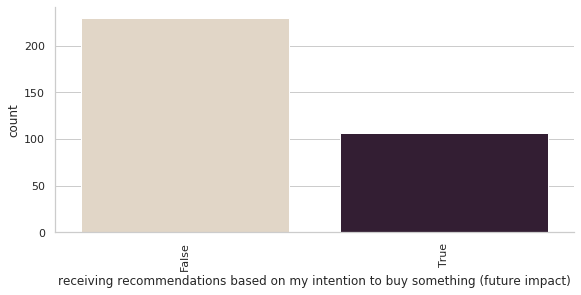

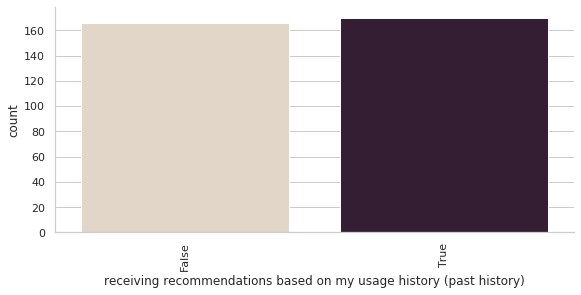

In [238]:
personalization=[
 'customizing user interface or service workflow taking into account my preferences',
 'receiving recommendations based on my intention to buy something (future impact)',
 'receiving recommendations based on my usage history (past history)']

for x in personalization: 
    a = sns.catplot(x=x, kind="count", palette="ch:.25", data=clean, size=4, aspect=2)
    a.set_xticklabels(rotation=90)

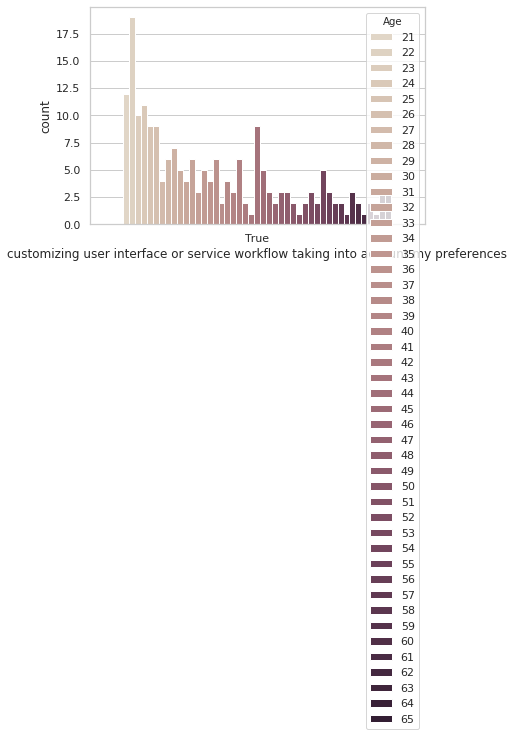

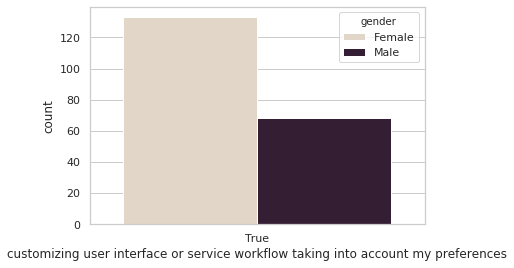

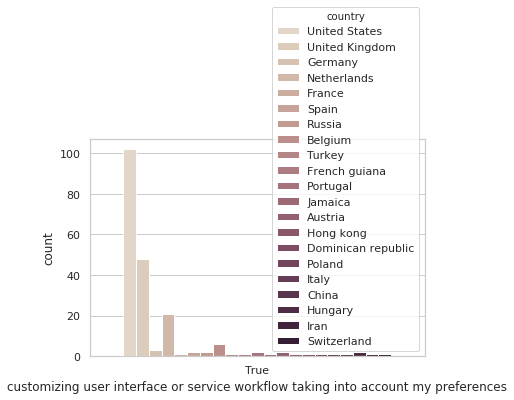

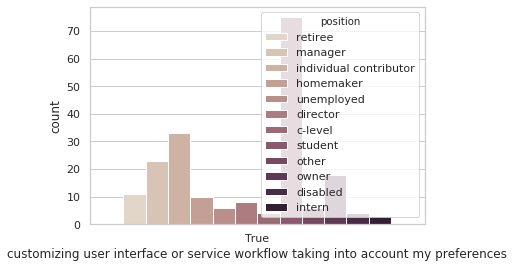

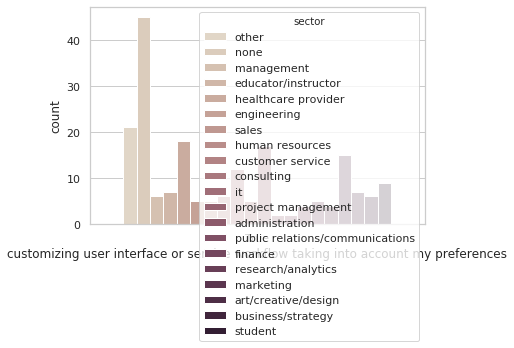

...

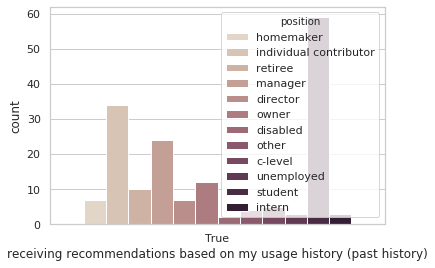

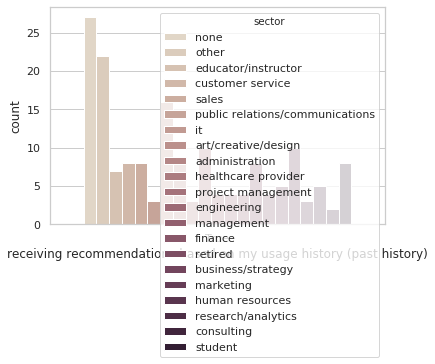

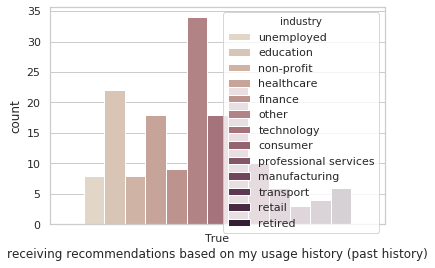

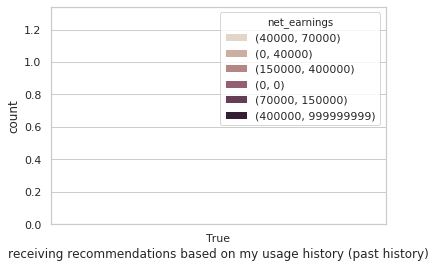

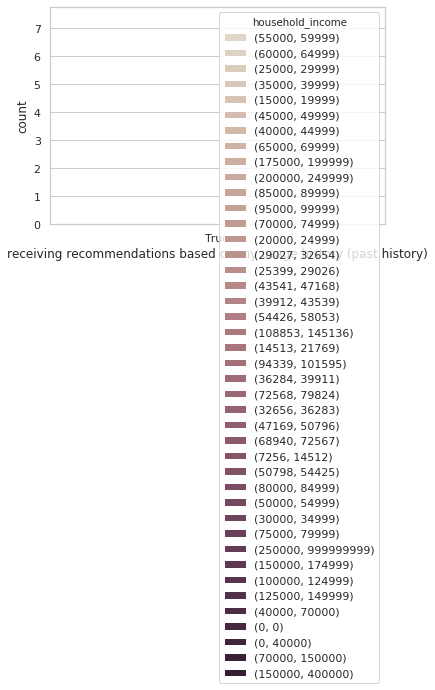

In [239]:
personalization=[
 'customizing user interface or service workflow taking into account my preferences',
 'receiving recommendations based on my intention to buy something (future impact)',
 'receiving recommendations based on my usage history (past history)']

for x in personalization: 
    for y in clean.columns[0:8]:
        a = sns.countplot(x=x, hue=y, palette="ch:.25", data=clean[clean[x] == True])
        plt.show()

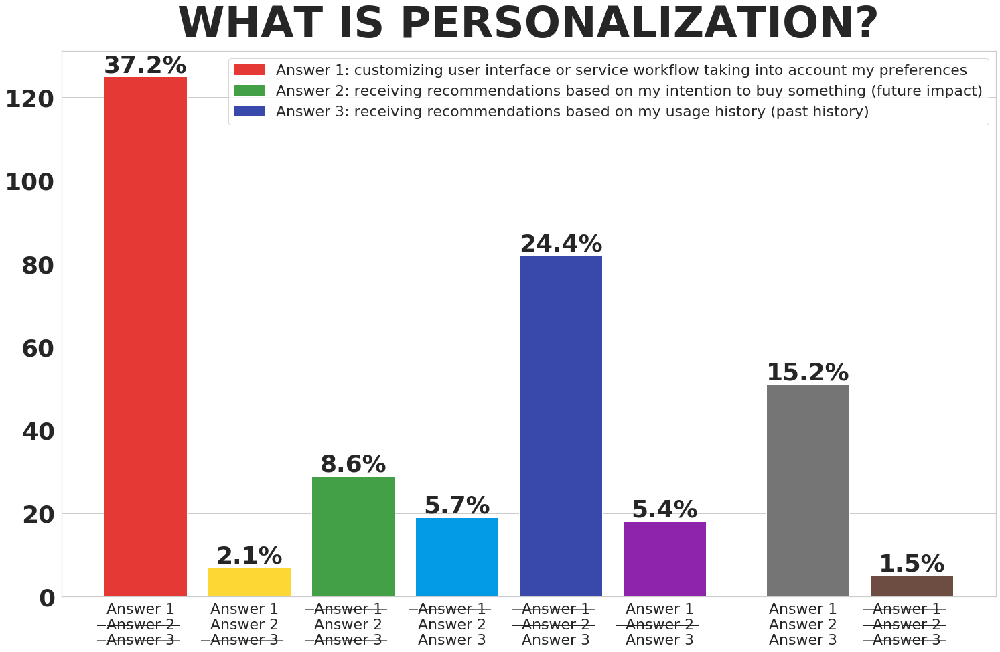

In [240]:
#BORIS
def strikethrough(text):
    new_text = ''
    for i in range(len(text)):
        new_text += '\u0336'+text[i]
    return new_text
sns.set(style="whitegrid")
personalization=[
 'customizing user interface or service workflow taking into account my preferences',
 'receiving recommendations based on my intention to buy something (future impact)',
 'receiving recommendations based on my usage history (past history)']
dfB = clean.loc[:,personalization]
#plot_multibar(dfB, personalization, groupby='Age range', title='What is personalization?\n(By age ranges)',
#              color_idx=[1,2,5],save=True)
mmap = dict({0:7,1:0,2:2,3:1,4:4,5:5,6:3,7:6})
dfB['marker'] = 1 * dfB.iloc[:,0].astype(int) + 2 * dfB.iloc[:,1].astype(int) + 4 * dfB.iloc[:,2].astype(int)
dfB['marker'] = dfB['marker'].apply(lambda x: mmap[x])
dfC = dfB['marker'].value_counts().sort_index()
labels = list()
answers = ['Answer 1  ','Answer 2  ','Answer 3  ']
labels.append(answers[0]+'\n'+strikethrough(answers[1])+'\n'+strikethrough(answers[2]))
labels.append(answers[0]+'\n'+answers[1]+'\n'+strikethrough(answers[2]))
labels.append(strikethrough(answers[0])+'\n'+answers[1]+'\n'+strikethrough(answers[2]))
labels.append(strikethrough(answers[0])+'\n'+answers[1]+'\n'+answers[2])
labels.append(strikethrough(answers[0])+'\n'+strikethrough(answers[1])+'\n'+answers[2])
labels.append(answers[0]+'\n'+strikethrough(answers[1])+'\n'+answers[2])
labels.append(answers[0]+'\n'+answers[1]+'\n'+answers[2])
labels.append(strikethrough(answers[0])+'\n'+strikethrough(answers[1])+'\n'+strikethrough(answers[2]))
plt.figure(figsize=(25,15))
ax = plt.bar(dfC.index.to_series().apply(lambda x: x+0.38 if x > 5 else x),width=0.8,color=COLORS[[0,12,9,6,4,2,17,16]],
        height=dfC.values)
plt.xticks(dfC.index.to_series().apply(lambda x: x+0.38 if x > 5 else x),labels,fontsize=22)
plt.yticks(fontsize=36,weight='bold')
new_hs = list()
new_hs.append(mpatches.Patch(color=COLORS[0], label='Answer 1: ' + personalization[0]))
new_hs.append(mpatches.Patch(color=COLORS[9], label='Answer 2: ' + personalization[1]))
new_hs.append(mpatches.Patch(color=COLORS[4], label='Answer 3: ' + personalization[2]))
plt.legend(handles=new_hs, fontsize=22)
plt.title('WHAT IS PERSONALIZATION?',fontdict={'fontsize':64,'weight':'bold'},pad=20)
plt.grid(b=None,axis='x')
total = dfC.sum()
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + 0.4
    y = p.get_y() + p.get_height()
    plt.text(x,y,percentage,fontsize=36,fontweight='bold',verticalalignment='bottom', horizontalalignment='center')
plt.savefig('personalization.png')
plt.show()

In [241]:
x = pd.options.display.max_seq_items
pd.options.display.max_seq_items = 2000
#print(clean.columns)
pd.options.display.max_seq_items = x

In [242]:
clean.columns

Index(['Age', 'gender', 'country', 'position', 'sector', 'industry',
       'net_earnings', 'household_income',
       'How do you feel about ...?[donating your information for scientific researches]',
       'How do you feel about ...?[getting personalized offers from companies, which you have sold your information?]',
       ...
       'How do you value the following information[Research for a new job]',
       'How do you value the following information[Salary information]',
       'How do you value the following information[Sexual orientation]',
       'How do you value the following information[Social network contacts]',
       'How do you value the following information[Social network groups]',
       'How do you value the following information[Travel history]',
       'How do you value the following information[Voice records (for identification, for example)]',
       'customizing user interface or service workflow taking into account my preferences',
       'receiving recommend

# Split test-train

In [243]:
clean['is_train'] = True
test_keys = pd.Series(clean.index).sample(frac=0.33, random_state=3432)
clean.loc[test_keys, 'is_train'] = False

In [244]:
meta = { 'sharing':  'How do you feel about sharing further information for personalized services',
 'value': 'How do you value the following information',
 'selling': 'How do you feel about you are SELLING automatically next information for personalized services directly to companies, chosen by yourself',
 'donating': 'How do you feel about you are DONATING automatically the money to charities from selling your information'
}
meta_col = { k: [x for x in clean.columns if x.startswith(v)] for k, v in meta.items()}
meta_re = { k: re.compile(v+'\[|]') for k, v in meta.items()}
scores_col = [x for c in meta_col.values() for x in c]
print(len(scores_col))

scores = pd.DataFrame(clean[ scores_col ].unstack(1).reset_index())
scores.columns = ['question_data', 'id', 'score']
def split(x):
    for k, v in meta.items():
        if x.startswith(v):
            return (k, meta_re[k].sub('', x))
    
scores ['question_type'], scores['data_type'] = list(zip(*scores['question_data'].apply(split)))
scores.drop('question_data', inplace=True, axis=1)
c = pd.DataFrame()
c['gender'] = clean['gender'].astype('category')
c['age'] = clean['Age']
c['position'] = clean['position'].astype('category')
c['sector'] = clean['sector'].astype('category')
c['industry'] = clean['industry'].astype('category')
c['customizing'] = clean['customizing user interface or service workflow taking into account my preferences']
c['recom_to_buy'] = clean['receiving recommendations based on my intention to buy something (future impact)'] 
c['recom_hist'] = clean['receiving recommendations based on my usage history (past history)'] 
c['sharing_feeling'] = clean['How do you feel about ...?[sharing your personal data with companies, which share your data with third-parties (Often clause in terms of use)]']
c['offers_feeling'] = clean["How do you feel about ...?[getting personalized offers from companies, which you haven't provided your information?]"]
c['net_earnings'] = clean['net_earnings'].apply(lambda x: x[0] if x else None)
c['household_income'] = clean['household_income'].apply(lambda x: x[0] if x else None)
c['is_train'] = clean['is_train']
c['is_unemployed'] = clean['position'] == 'unemployed'
descriptive = list(set(c.columns) - {'is_train'})
scores_plus = scores.join(c, on='id')
scores_plus = scores_plus.reset_index()

156


In [245]:
display(scores_plus['question_type'].value_counts())
display(scores_plus['position'].value_counts())

selling     52494
sharing     52494
value       52494
donating    52494
Name: question_type, dtype: int64

student                   51636
individual contributor    39624
manager                   29640
retiree                   19500
owner                     17628
homemaker                 10920
director                  10452
other                      8580
unemployed                 7800
c-level                    7020
disabled                   4368
intern                     2808
Name: position, dtype: int64

In [246]:
# household_income shouldn't be less than net_earning
# scores_plus.loc[scores_plus['household_income'] < scores_plus['net_earnings']]

In [247]:
# linear regression
formula='score ~ ' + '+'.join(list(descriptive) + ['question_type+data_type'])
mod = smf.ols(formula=formula, data=scores_plus.loc[scores_plus['question_type'] == 'selling'])
mod.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  score   R-squared:                       0.078
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                     48.67
Date:                Sun, 20 Oct 2019   Prob (F-statistic):               0.00
Time:                        07:52:51   Log-Likelihood:                -88736.
No. Observations:               51831   AIC:                         1.777e+05
Df Residuals:                   51740   BIC:                         1.785e+05
Df Model:                          90                                         
Covariance Type:            nonrobust                                         
=======================================================================================================================================
                                                                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                               2.0376      0.081     25.252      0.000       1.879       2.196
recom_hist[T.True]                                                      0.0756      0.014      5.343      0.000       0.048       0.103
recom_to_buy[T.True]                                                    0.0472      0.014      3.288      0.001       0.019       0.075
position[T.director]                                                    0.0866      0.047      1.850      0.064      -0.005       0.178
position[T.disabled]                                                    0.2330      0.060      3.860      0.000       0.115       0.351
position[T.homemaker]                                                  -0.0488      0.049     -0.992      0.321      -0.145       0.048
position[T.individual contributor]                                     -0.0062      0.039     -0.160      0.873      -0.083       0.070
position[T.intern]                                                     -0.1563      0.065     -2.418      0.016      -0.283      -0.030
position[T.manager]                                                     0.1103      0.038      2.877      0.004       0.035       0.185
position[T.other]                                                       0.0510      0.049      1.032      0.302      -0.046       0.148
position[T.owner]                                                       0.0061      0.042      0.147      0.883      -0.075       0.088
position[T.retiree]                                                     0.1482      0.047      3.124      0.002       0.055       0.241
position[T.student]                                                    -0.0120      0.042     -0.288      0.773      -0.094       0.070
position[T.unemployed]                                                  0.0433      0.028      1.557      0.119      -0.011       0.098
gender[T.Male]                                                         -0.0856      0.014     -5.945      0.000      -0.114      -0.057
is_unemployed[T.True]                                                   0.0433      0.028      1.557      0.119      -0.011       0.098
customizing[T.True]                                                    -0.0067      0.014     -0.461      0.645      -0.035       0.022
industry[T.education]                                                  -0.1850      0.029     -6.328      0.000      -0.242      -0.128
industry[T.finance]                                                    -0.1695      0.039     -4.380      0.000      -0.245      -0.094
industry[T.healthcare]                                                  0.0797      0.038  

In [248]:
def data(frame, question_type, is_train=True):
    return frame[(frame['question_type']==question_type) & (frame['is_train']==is_train) & (frame['t'].notnull())]
    

def score(frame, res, question_type):
    
    s=data(frame, question_type, is_train=False)
    # test set
    pred = res.predict(s)
    test_observed = s['t']
    test_resid = test_observed - pred
    display
    # train set
    fitted = res.mu
    train_observed = res.model.endog#/res.model.endog.sum()
    train_resid = train_observed - fitted
    
    # residual vs predicted
    #fig, ax = plt.subplots(figsize=(6,2.5))
    #ax.set_title('residuals vs predicted')
    #ax.set_xlabel('predicted')
    #ax.set_ylabel('residuals')
    #resid_vs_pred = ax.scatter(pred,test_resid)
    #rms = math.sqrt(((test_observed - pred)**2).mean()) # RMS
    #print(rms)
    #plt.show()
    plot_violin(pd.DataFrame({'observed': test_observed, 'predicted':pred}), ['observed'], 'predicted', 'GnBu')
    
    # fitted values vs observed values
    #fig, ax = plt.subplots()
    #ax.scatter(fitted, train_observed)
    #line_fit = sm.OLS(train_observed, sm.add_constant(fitted, prepend=True)).fit()
    #abline_plot(model_results=line_fit, ax=ax)
    #ax.set_title('Model Fit Plot')
    #ax.set_ylabel('Observed values')
    #ax.set_xlabel('Fitted values')
    #plt.show()
    
    plot_violin(pd.DataFrame({'observed': train_observed, 'fitted':fitted}), ['observed'], 'fitted', 'GnBu')
    
    # fitted values vs pearson residuals
    fig, ax = plt.subplots()
    ax.scatter(fitted, res.resid_pearson)
    ax.hlines(0, 0, 1)
    ax.set_xlim(0, 1)
    ax.set_title('Residual Dependence Plot')
    ax.set_ylabel('Pearson Residuals')
    ax.set_xlabel('Fitted values')
    plt.show()
    
    # histogram of standarsized deviance residuals
    fig, ax = plt.subplots()
    resid = res.resid_deviance.copy()
    resid_std = stats.zscore(resid)
    ax.hist(resid_std, bins=25)
    ax.set_title('Histogram of standardized deviance residuals')
    plt.show()
    
    # QQ plot of deviance residuals
    graphics.gofplots.qqplot(resid, line='r')
    plt.show()



In [249]:
scores_plus['t'] = scores_plus['score'].apply(lambda score: 1 if score>2 else (0 if score < 3 else None))
print(scores_plus['t'].value_counts(dropna=False))

0    136488
1     73488
Name: t, dtype: int64


In [250]:
def coeff2prob(coeff):
    odds = np.exp(coeff)
    return odds / ( 1 + odds) 

In [251]:
# Fit a binomial distribution on dependent variables
for x in ['donating', 'sharing', 'selling']:
    mod = smf.glm(formula='t ~ 1', data=data(scores_plus, x),family=sm.families.Binomial())

    res=mod.fit()
    #score(scores_plus, res, 'selling')
    print('fit result for t ~ 1', x)
    display(res.summary())
    conf_int= res.conf_int()
    print('probability %s == 1: %s(%s, %s)' %(x, coeff2prob(res.params.loc['Intercept']), 
                                             coeff2prob(conf_int[0].loc['Intercept']), 
                                             coeff2prob(conf_int[1].loc['Intercept'])) )
    

fit result for t ~ 1 donating


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      t   No. Observations:                 8970
Model:                            GLM   Df Residuals:                     8969
Model Family:                Binomial   Df Model:                            0
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5000.3
Date:                Sun, 20 Oct 2019   Deviance:                       10001.
Time:                        07:52:52   Pearson chi2:                 8.97e+03
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.1222      0.025    -45.750      0.000      -1.170      -1.074
==============================================================================
"""

probability donating == 1: 0.24559643255295377(0.23679805699047404, 0.2546126566273285)
fit result for t ~ 1 sharing


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      t   No. Observations:                 8970
Model:                            GLM   Df Residuals:                     8969
Model Family:                Binomial   Df Model:                            0
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5351.9
Date:                Sun, 20 Oct 2019   Deviance:                       10704.
Time:                        07:52:52   Pearson chi2:                 8.97e+03
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.9250      0.023    -39.502      0.000      -0.971      -0.879
==============================================================================
"""

probability sharing == 1: 0.2839464882943144(0.27470839645217277, 0.29336958592228446)
fit result for t ~ 1 selling


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      t   No. Observations:                 8970
Model:                            GLM   Df Residuals:                     8969
Model Family:                Binomial   Df Model:                            0
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5182.5
Date:                Sun, 20 Oct 2019   Deviance:                       10365.
Time:                        07:52:53   Pearson chi2:                 8.97e+03
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.0225      0.024    -42.714      0.000      -1.069      -0.976
==============================================================================
"""

probability selling == 1: 0.2645484949832776(0.2555217403453202, 0.27377686742595925)


1) Do people agree and/or prefer to sell their data on their own?
    - from the table above, we can inferred that the probability of an individual to be willing to sell their own data is 30%.

2) Do people agree and/or prefer to donate the money from selling their data?
    - from the table above, we can inferred that the probability of an individual to be willing to donating their own data is 29%.
    
    - The results are statistical significant and the error are very tight.
    - These results don't take into account the types of information to be sold or donated.
    - It's interesting that individuals seem to be more willing to share information (probability = 39%) than selling or donating information.

In [237]:
formula1= 't ~ household_income + recom_to_buy + recom_hist + offers_feeling '\
           '+ net_earnings + customizing + sharing_feeling + gender'\
           '+ age + data_type + position + sector + industry' # -3914
 
formula2= 't ~ net_earnings + offers_feeling '\
           '+ customizing + sharing_feeling + gender'\
           '+ age + data_type' # LL -4327

formula3= 't ~ household_income + offers_feeling '\
           '+ customizing + sharing_feeling + gender'\
           '+ age + data_type' # LL -4337


formula4= 't ~ I(net_earnings**2) + offers_feeling '\
           '+ customizing + sharing_feeling + gender'\
           '+ age + data_type ' # LL -4320


formula5= 't ~ I(net_earnings**2) '\
           '+ customizing +  gender'\
           '+ age + data_type' # LL -4400


formula6= 't ~ I(net_earnings**2) '\
           ' + sharing_feeling + gender'\
           '+ age' # LL -4959


formula7= 't ~ data_type ' # LL -4488


formula8= 't ~ data_type + I(net_earnings**2) + age + gender + sharing_feeling + offers_feeling + customizing' # LL -4385

formula9= 't ~  recom_to_buy + recom_hist + offers_feeling '\
           '+ net_earnings + customizing + sharing_feeling + gender'\
           '+ age + data_type + position + sector + industry' # -3919

formula10= 't ~  recom_to_buy + recom_hist + offers_feeling '\
           '+ I(household_income ) + I(net_earnings**2) + customizing + sharing_feeling + gender'\
           '+ I(age) + data_type + position + sector + industry ' # -3911


formula11= 't ~  recom_to_buy + recom_hist + sharing_feeling + offers_feeling '\
           '+ I(household_income ) + I(net_earnings**2) + customizing +  gender'\
           '+ I(age**2) + data_type + position + sector + industry ' # -3910


formula12= 't ~   recom_hist'\
           '+ I(sharing_feeling)+(offers_feeling) '\
           '+ I(household_income ) + I(net_earnings**2) + customizing '\
           '+ I(age**2) + data_type + position + sector + industry ' # -3910

formula13= 't ~  position + sector + industry ' # -3910

formula14= 't ~ data_type + gender + I(net_earnings) + I(age) +  is_unemployed ' # -4439


formula=formula14

question_type: "sharing", model: "t ~ data_type + gender + I(net_earnings) + I(age) +  is_unemployed "


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      t   No. Observations:                 8931
Model:                            GLM   Df Residuals:                     8888
Model Family:                Binomial   Df Model:                           42
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4970.1
Date:                Tue, 08 Oct 2019   Deviance:                       9940.1
Time:                        09:01:17   Pearson chi2:                 8.92e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
=======================================================================================================================================
                                                                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                              -0.7605      0.156     -4.879      0.000      -1.066      -0.455
data_type[T.About your research to buy an apartment]                   -0.4186      0.206     -2.035      0.042      -0.822      -0.015
data_type[T.About your research to buy clothes]                         0.3703      0.193      1.918      0.055      -0.008       0.749
data_type[T.About your research to buy devices]                         0.2803      0.194      1.447      0.148      -0.099       0.660
data_type[T.About your research to buy intimate goods (for adults)]    -1.1798      0.236     -4.994      0.000      -1.643      -0.717
data_type[T.About your research to buy land]                           -0.3958      0.205     -1.930      0.054      -0.798       0.006
data_type[T.About your research to buy medicine]                       -0.4649      0.207     -2.246      0.025      -0.871      -0.059
data_type[T.About your research to receive credit for something]       -0.3733      0.205     -1.825      0.068      -0.774       0.028
data_type[T.About your research to receive medical services]           -0.6364      0.212     -2.998      0.003      -1.052      -0.220
data_type[T.About your research to rent an apartment]                  -0.2639      0.202     -1.307      0.191      -0.660       0.132
data_type[T.Apartment bills]                                           -1.6562      0.268     -6.176      0.000      -2.182      -1.131
data_type[T.Birthday]                                                   0.5473      0.192      2.846      0.004       0.170       0.924
data_type[T.Clinical records]                                          -1.0412      0.229     -4.547      0.000      -1.490      -0.592
data_type[T.DNA]                                                       -1.0412      0.229     -4.547      0.000      -1.490      -0.592
data_type[T.Education]                                                  0.6527      0.192      3.396      0.001       0.276       1.029
data_type[T.Face photos (for identification)]                          -0.2006      0.201     -1.000      0.317      -0.594       0.192
data_type[T.Fingerprints]                                              -0.8845      0.222     -3.988      0.000      -1.319      -0.450
data_type[T.Grades in particular exams]                                -0.7976      0.218     -3.655      0.000      -1.225      -0.370
data_type[T.Having children]                                            0.2984      0.194      1.542      0.123      -0.081       0.678
data_type[T.Information about your daily mood]                         -0.3733      0.205  

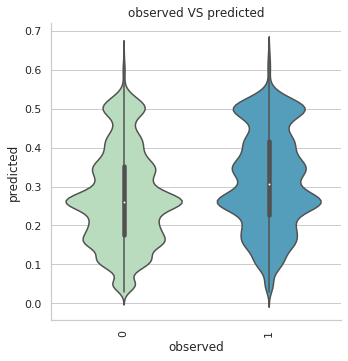

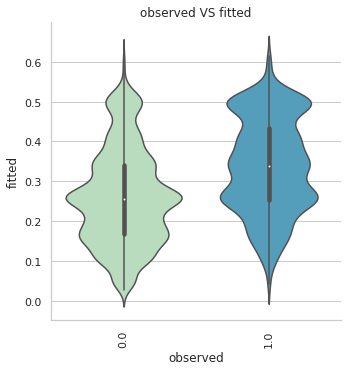

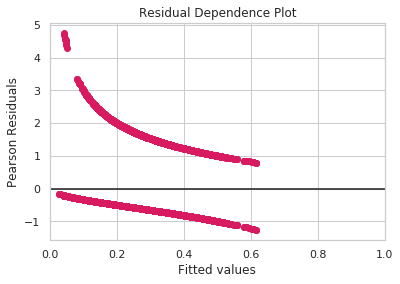

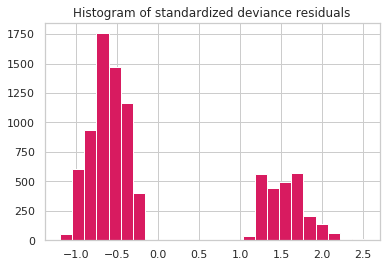

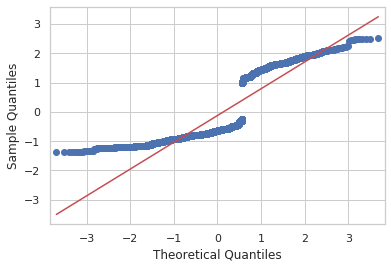

question_type: "selling", model: "t ~ data_type + gender + I(net_earnings) + I(age) +  is_unemployed "


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      t   No. Observations:                 8931
Model:                            GLM   Df Residuals:                     8888
Model Family:                Binomial   Df Model:                           42
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4904.3
Date:                Tue, 08 Oct 2019   Deviance:                       9808.5
Time:                        09:01:21   Pearson chi2:                 8.93e+03
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
=======================================================================================================================================
                                                                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                              -0.5461      0.156     -3.506      0.000      -0.851      -0.241
data_type[T.About your research to buy an apartment]                   -0.5801      0.210     -2.769      0.006      -0.991      -0.169
data_type[T.About your research to buy clothes]                         0.0574      0.196      0.293      0.769      -0.326       0.441
data_type[T.About your research to buy devices]                     -2.969e-12      0.196  -1.51e-11      1.000      -0.385       0.385
data_type[T.About your research to buy intimate goods (for adults)]    -1.0277      0.227     -4.525      0.000      -1.473      -0.583
data_type[T.About your research to buy land]                           -0.1582      0.199     -0.795      0.427      -0.548       0.232
data_type[T.About your research to buy medicine]                       -0.5801      0.210     -2.769      0.006      -0.991      -0.169
data_type[T.About your research to receive credit for something]       -0.7076      0.214     -3.310      0.001      -1.127      -0.289
data_type[T.About your research to receive medical services]           -0.9338      0.223     -4.191      0.000      -1.370      -0.497
data_type[T.About your research to rent an apartment]                  -0.5315      0.208     -2.555      0.011      -0.939      -0.124
data_type[T.Apartment bills]                                           -1.1280      0.232     -4.859      0.000      -1.583      -0.673
data_type[T.Birthday]                                                   0.3507      0.193      1.820      0.069      -0.027       0.728
data_type[T.Clinical records]                                          -0.9957      0.226     -4.413      0.000      -1.438      -0.554
data_type[T.DNA]                                                       -1.3529      0.245     -5.521      0.000      -1.833      -0.873
data_type[T.Education]                                                  0.3507      0.193      1.820      0.069      -0.027       0.728
data_type[T.Face photos (for identification)]                          -0.7613      0.216     -3.528      0.000      -1.184      -0.338
data_type[T.Fingerprints]                                              -1.0277      0.227     -4.525      0.000      -1.473      -0.583
data_type[T.Grades in particular exams]                                -0.4841      0.207     -2.343      0.019      -0.889      -0.079
data_type[T.Having children]                                           -0.1786      0.199     -0.896      0.370      -0.569       0.212
data_type[T.Information about your daily mood]                         -0.4378      0.205  

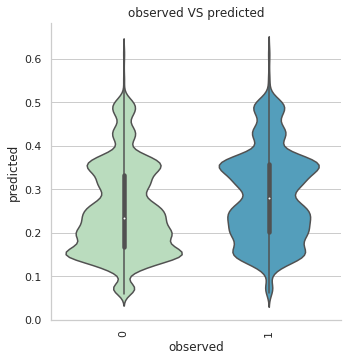

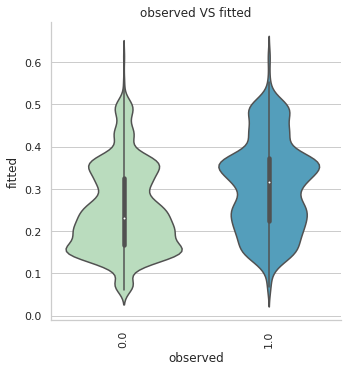

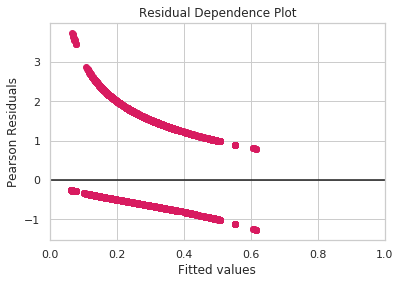

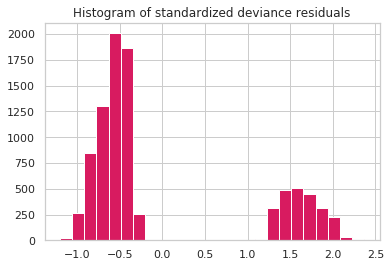

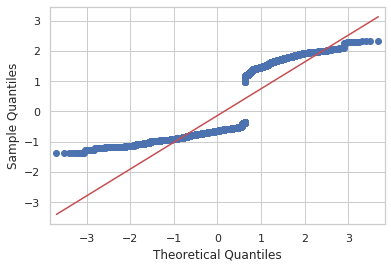

question_type: "donating", model: "t ~ data_type + gender + I(net_earnings) + I(age) +  is_unemployed "


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      t   No. Observations:                 8931
Model:                            GLM   Df Residuals:                     8888
Model Family:                Binomial   Df Model:                           42
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4784.6
Date:                Tue, 08 Oct 2019   Deviance:                       9569.3
Time:                        09:01:27   Pearson chi2:                 8.94e+03
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
=======================================================================================================================================
                                                                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                              -0.5812      0.160     -3.630      0.000      -0.895      -0.267
data_type[T.About your research to buy an apartment]                   -0.1918      0.207     -0.928      0.353      -0.597       0.213
data_type[T.About your research to buy clothes]                         0.2927      0.198      1.478      0.139      -0.095       0.681
data_type[T.About your research to buy devices]                         0.1788      0.200      0.896      0.370      -0.212       0.570
data_type[T.About your research to buy intimate goods (for adults)]    -1.1752      0.248     -4.747      0.000      -1.660      -0.690
data_type[T.About your research to buy land]                            0.0204      0.202      0.101      0.920      -0.376       0.417
data_type[T.About your research to buy medicine]                       -0.6108      0.220     -2.780      0.005      -1.041      -0.180
data_type[T.About your research to receive credit for something]       -0.6108      0.220     -2.780      0.005      -1.041      -0.180
data_type[T.About your research to receive medical services]           -1.0212      0.239     -4.280      0.000      -1.489      -0.554
data_type[T.About your research to rent an apartment]                  -0.1697      0.206     -0.823      0.410      -0.574       0.234
data_type[T.Apartment bills]                                           -1.0960      0.243     -4.514      0.000      -1.572      -0.620
data_type[T.Birthday]                                                   0.1980      0.199      0.994      0.320      -0.192       0.589
data_type[T.Clinical records]                                          -0.9852      0.237     -4.163      0.000      -1.449      -0.521
data_type[T.DNA]                                                       -0.8178      0.228     -3.581      0.000      -1.265      -0.370
data_type[T.Education]                                                  0.4036      0.197      2.050      0.040       0.018       0.789
data_type[T.Face photos (for identification)]                          -0.6672      0.222     -3.007      0.003      -1.102      -0.232
data_type[T.Fingerprints]                                              -0.6672      0.222     -3.007      0.003      -1.102      -0.232
data_type[T.Grades in particular exams]                                -0.2594      0.208     -1.245      0.213      -0.668       0.149
data_type[T.Having children]                                            0.1400      0.200      0.700      0.484      -0.252       0.532
data_type[T.Information about your daily mood]                         -0.4774      0.215  

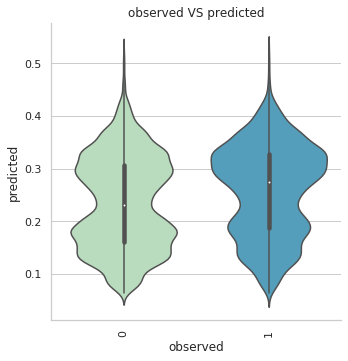

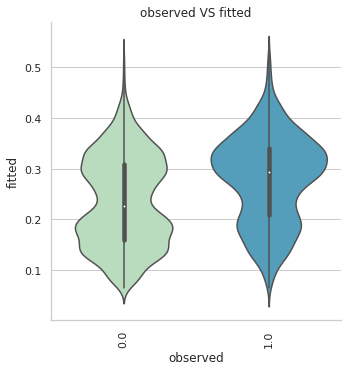

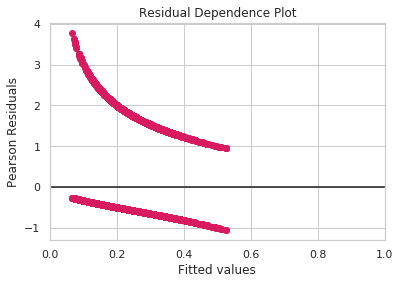

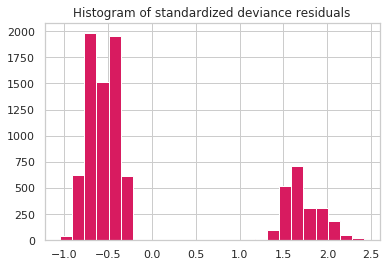

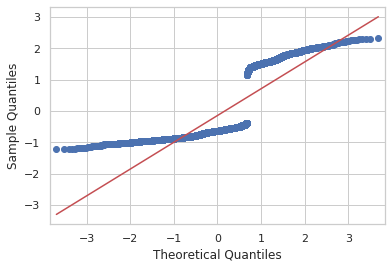

In [238]:
# Binomial logistic regression model
def fit_for(frame, question_type):
 
    mod = smf.glm(formula=formula, data=data(frame, question_type), 
                  family=sm.families.Binomial())


    print('question_type: "{}", model: "{}"' .format(question_type, formula))
    res=mod.fit()
    display(res.summary())
    score(scores_plus, res, question_type)

for question_type in ['sharing', 'selling', 'donating']:
    fit_for(scores_plus, question_type)

In [239]:
display(pd.DataFrame(res.params, columns=['weight']).reset_index().sort_values('weight'))


,index,weight
0,Intercept,-1.02246


Who are the people who are willing to sell/donate/share their data?

a)SHARING:
From the table above we can inferred that:
    - The male individuals are slightly more to be willing to share their data than the female ones.
    - The older individuals are slightly more to be willing to share their data than the younger ones.
    - The individuals having lower net earning are slightly more to be willing to share that the those ones with higher net earning
    - The unempolyed individuals are more likely to be willing to share than employed individuals.
    
b)SELLING 
From the table above we can inferred that:
    - The female individuals are likely more to be willing to sell their data than the male ones.
    - The younger individuals are slightly more to be willing to sell their data than the older ones.
    - The individuals having lower net earning are likely more to be willing to sell that the those ones with higher net earning
    - The unempolyed individuals are more likely to be willing to sell than employed individuals.
    
c)DONATING
From the table above we can inferred that:
    - The female individuals are slightly more to be willing to donate their data than the male ones.
    - The younger individuals are slightly more to be willing to donate their data than the older ones.
    - The individuals having lower net earning are likely more to be willing to donate that the those ones with higher net earning
    - The unempolyed individuals are less likely to be willing to donate than employed individuals.

The data are all stitistical relevant (p<0.05).

'fitting t ~ data_type for question_type=sharing'

'fitting t ~ data_type for question_type=donating'

'fitting t ~ data_type for question_type=selling'

'fitting t ~ data_type for question_type=value'

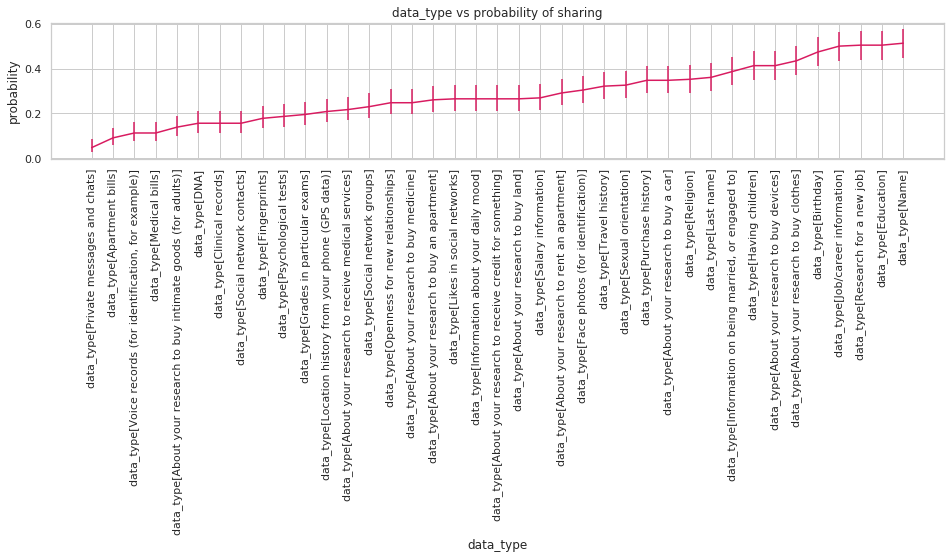

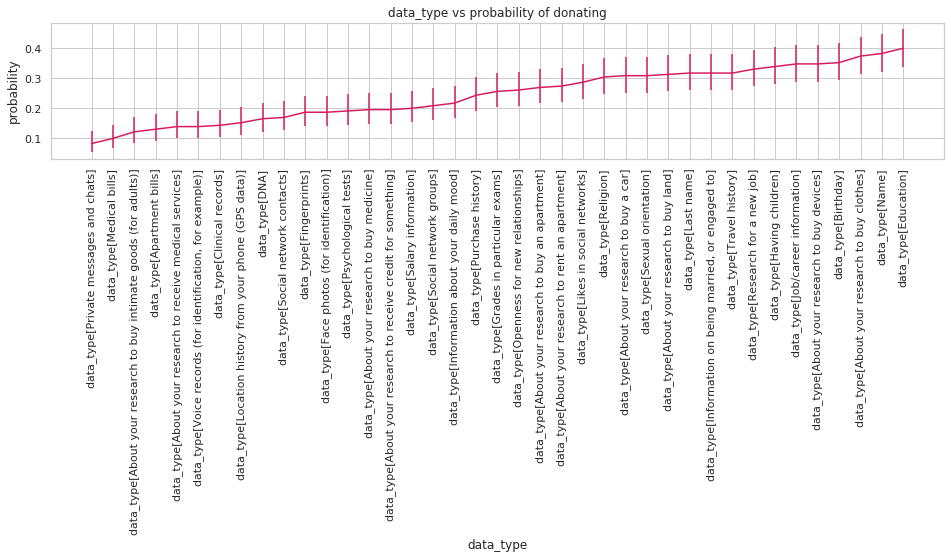

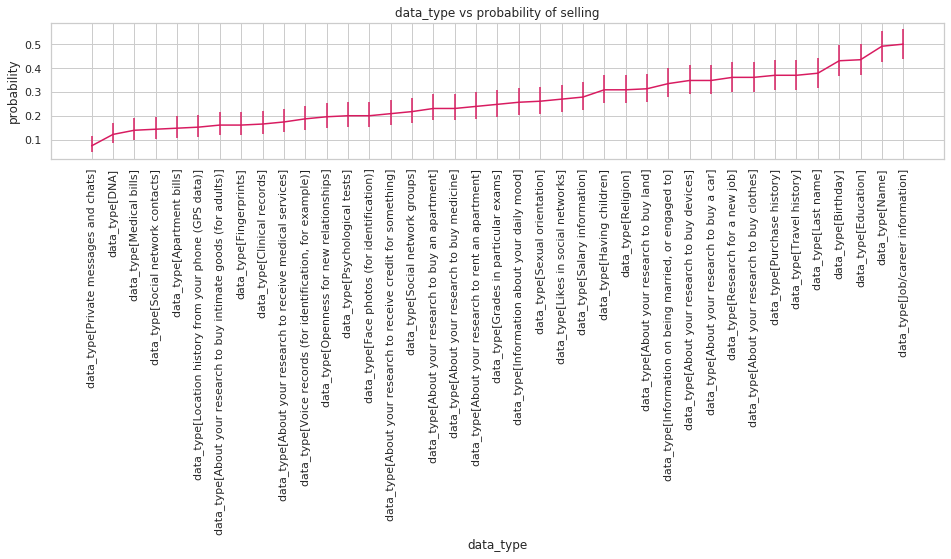

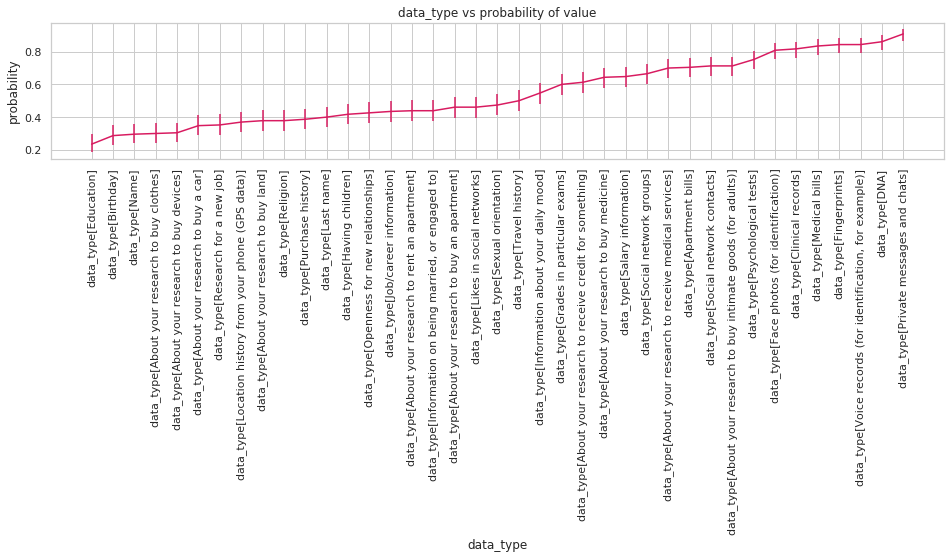

In [240]:
# Binomial logistic regression model using only data_type column
for x in ['sharing', 'donating', 'selling', 'value']:
    col='data_type'
    display('fitting t ~ %s for question_type=%s'%(col, x))
    mod = smf.glm(formula='t~%s -1'%(col), data=data(scores_plus, x), 
              family=sm.families.Binomial())
    res=mod.fit()
    conf_int = res.conf_int()

    weights=pd.DataFrame(dict(weight=coeff2prob(res.params), p=res.pvalues,lo=coeff2prob(conf_int[0]), hi=coeff2prob(conf_int[1]))).reset_index().sort_values('weight')
    dlo = weights['weight'] - weights['lo']
    dhi =  weights['hi'] - weights['weight']

    fig, ax = plt.subplots(figsize=(16,2.5))
    plt.xticks(rotation=90)
    ax.set_title('%s vs probability of %s'%(col, x))
    ax.set_xlabel(col)
    ax.set_ylabel('probability')
    resid_vs_pred = ax.errorbar(weights['index'], weights['weight'], [dlo, dhi])
    #display(weights)
    


1) what data people are more likely open to selling, and what are not?
    - from the plot above we can inferred that individuals are more likely open to   either sharing or donate personal/not private information such as name,
    education, career, age, last name, numer of children, religion;
    - However individuals are less likely open to sell personal/private information like medical information, private communication and personal bills.
    - The majority of these data are statistical significant (p<0.05) and the error bars are fairly tight.

2) What data do people value more than others and who are them?
    - from  the plot above we can inferred that the data that individuals are more likely to value more than others are those ones that individuals are less likely open to sell either sharing or donate (like medical information, private communication, personal bills);
    - However the data more likely to be valued less are the data that the individuals are more likely to either sharing or donate (personal/not private information such as name, education, career, age, last name, numer of children, religion).
    

In [241]:
# start MLE=-23076
# Binomial logistic regression model (regularized, LASSO penalization, then refit with non zero coeffs)
    #mod = smf.glm(formula=formula, data=data(scores_plus, 'selling'), 
                  #family=sm.families.Binomial())
    #res=mod.fit_regularized(alpha=0.002, L1_wt=1, refit=True)
    #score(scores_plus, res, 'selling')

    #res.summary()

In [242]:
#for c in c.columns:
    #print (c, len(scores_plus.loc[scores_plus[c].notnull()]))

In [243]:
# generalized linear mixed model, with random variable for each responder (id).
# note: does not converge
#from statsmodels.genmod.bayes_mixed_glm import BinomialBayesMixedGLM
#mod = BinomialBayesMixedGLM.from_formula(formula, {'id':'0 + C(id)'}, scores_plus.loc[scores_plus['household_income'].notnull()])
#print (mod.endog)

In [244]:
#mod.fit_map().summary()

# Handling null values

I tried to solve the problem regarding the null value in this way:
- regarding 'gender' and 'age' columns, a single row from the original dataframe had a null value from this columns. After pivoting this expands to 117 columns.
- regarding 'net_earnings' three rows were missing this value. I removed those rows as they were tiny part of the dataset.
- finally 'household_income' was completely missing from one of the file.
- As 'net_earnings' was a lower bound of the 'household_income' I used it as a substitute for that.
 
To avoid overfitting I divided the dataframe in two parts: test and train and then I optimized the model from them.

# Conclusions

1) What do you think the definition of “personalization” is?
    - The 59% of individuals (standard deviation = 0.49) think that the personalization is customizing user interface or service workflow taking into account their preferences.
    - The 31% of individuals (standard deviation = 0.46) think that the personalization is receiving recommendations based on their intention to buy something (future impact).
    - The 50% of individuals (standard dedviation = 0.50) think that the personalization is receiving recommendations based on their usage history (past history).

2) Do people agree and/or prefer to sell/donate/sharing their data on their own? 
    - the probability of an individual to be willing to sell their own data is 30%.
    - the probability of an individual to be willing to donating their own data is 29%.
    - The results are statistical significant and the error are very tight.
    - These results don't take into account the types of information to be sold or donated.
    - It's interesting that individuals seem to be more willing to share information (probability = 39%) than selling or donating information.
    
3) What data people are more likely open to selling/donating/sharing, and what are not?
    - individuals are more likely open to sell either sharing or donate personal/not private infromeation such as name, education, career, age, last name, numer of children, religion.
    - individuals are less likely open to sell personal/private information like medical information, private communication and personal bills.
    - The majority of these data are statistical significant (p<0.05) and the error bars are fairly tight.
    
4) Who are the people who are willing to sell/donate/share their data?
a)SHARING:
From the table above we can inferred that:
    - The male individuals are slightly more to be willing to share their data than the female ones.
    - The older individuals are slightly more to be willing to share their data than the younger ones.
    - The individuals having lower net earning are slightly more to be willing to share that the those ones with higher net earning
    - The unempolyed individuals are more likely to be willing to share than employed individuals.
    
b)SELLING 
From the table above we can inferred that:
    - The female individuals are likely more to be willing to sell their data than the male ones.
    - The younger individuals are slightly more to be willing to sell their data than the older ones.
    - The individuals having lower net earning are likely more to be willing to sell that the those ones with higher net earning
    - The unempolyed individuals are more likely to be willing to sell than employed individuals.
    
c)DONATING
From the table above we can inferred that:
    - The female individuals are slightly more to be willing to donate their data than the male ones.
    - The younger individuals are slightly more to be willing to donate their data than the older ones.
    - The individuals having lower net earning are likely more to be willing to donate that the those ones with higher net earning
    - The unempolyed individuals are less likely to be willing to donate than employed individuals.

The data are all stitistical relevant (p<0.05).


5) What data do people value more than others and who are them?
    - the data more likely to be valued more than others are those ones that individuals are less likely open to sell either sharing or donate (like medical information, private communication, personal bills);
    
    - the data more likely to be valued less are the data that the individuals are more likely to either sharing or donate (personal/not private information such as name, education, career, age, last name, numer of children, religion).

# Future works

It may be usefull to add a feuture regarding the type of education the individual achieved (primary school, secondary school, BSc, MSc, PhD, etc..). This could help for a better understanding of the trends of the data.